In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import re

import statsmodels.api as sm
from statsmodels.iolib.summary2 import summary_col


<jemalloc>: MADV_DONTNEED does not work (memset will be used instead)
<jemalloc>: (This is the expected behaviour if you are running under QEMU)


## data clean

### contract data

In [ ]:
# the london data was selected
Zoopla = pd.read_csv('data/zoopla-london.csv')

In [ ]:
Zoopla.info()

In [ ]:
z2019 = pd.read_csv('data/2019.csv')
z2020 = pd.read_csv('data/2020.csv')
z2021 = pd.read_csv('data/2021.csv')
z2022 = pd.read_csv('data/2022.csv')

In [ ]:
# Drop unimportant columns
Zoopla_2019 = z2019[['property_id','property_type', 'lon', 'lat', 'price_last', 'end_date','start_date', 'num_bed_last','num_floors_max','num_bath_max','description'
                       ]].copy()
Zoopla_2020 = z2020[['property_id','property_type', 'lon', 'lat', 'price_last', 'end_date','start_date', 'num_bed_last','num_floors_max','num_bath_max','description'
                       ]].copy()
Zoopla_2021 = z2021[['property_id','property_type', 'lon', 'lat', 'price_last', 'end_date','start_date', 'num_bed_last','num_floors_max','num_bath_max','description'
                       ]].copy()
Zoopla_2022 = z2022[['property_id','property_type', 'lon', 'lat', 'price_last', 'end_date','start_date', 'num_bed_last','num_floors_max','num_bath_max','description'
                       ]].copy()

In [ ]:
Zoopla_2019.info()

In [ ]:
Zoopla_2019[['e_year', 'e_month','e_day']] = Zoopla_2019['end_date'].str.split('-|/', expand=True)
Zoopla_2019.info()

In [ ]:
Zoopla_2020[['e_year', 'e_month','e_day']] = Zoopla_2020['end_date'].str.split('-|/', expand=True)
Zoopla_2021[['e_year', 'e_month','e_day']] = Zoopla_2021['end_date'].str.split('-|/', expand=True)
Zoopla_2022[['e_year', 'e_month','e_day']] = Zoopla_2022['end_date'].str.split('-|/', expand=True)

In [ ]:
Zoopla_2019['end_date_new'] = Zoopla_2019[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)

In [ ]:
Zoopla_2020['end_date_new'] = Zoopla_2020[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)
Zoopla_2021['end_date_new'] = Zoopla_2021[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)
Zoopla_2022['end_date_new'] = Zoopla_2022[['e_year', 'e_month','e_day']].apply('-'.join, axis=1)

In [ ]:
Zoopla_2019[['s_year', 's_month','s_day']] = Zoopla_2019['start_date'].str.split('-|/', expand=True)
Zoopla_2019.info()

In [ ]:
Zoopla_2020[['s_year', 's_month','s_day']] = Zoopla_2020['start_date'].str.split('-|/', expand=True)
Zoopla_2021[['s_year', 's_month','s_day']] = Zoopla_2021['start_date'].str.split('-|/', expand=True)
Zoopla_2022[['s_year', 's_month','s_day']] = Zoopla_2022['start_date'].str.split('-|/', expand=True)

In [ ]:
Zoopla_2019['start_date_new'] = Zoopla_2019[['s_year', 's_month','s_day']].apply('-'.join, axis=1)

In [ ]:
Zoopla_2020['start_date_new'] = Zoopla_2020[['s_year', 's_month','s_day']].apply('-'.join, axis=1)
Zoopla_2021['start_date_new'] = Zoopla_2021[['s_year', 's_month','s_day']].apply('-'.join, axis=1)
Zoopla_2022['start_date_new'] = Zoopla_2022[['s_year', 's_month','s_day']].apply('-'.join, axis=1)

In [ ]:
Zoopla_2019.info()

In [ ]:
weekly19=Zoopla_2019.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly19

In [ ]:
Zoopla_2019_1=Zoopla_2019.copy()
Zoopla_2019_1['edate']=pd.to_datetime(Zoopla_2019['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_2019_1.set_index('edate',inplace=True)

monthly_price=Zoopla_2019_1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()
monthly_price

In [ ]:
x = monthly_price['edate']
y = monthly_price['price_last']

# Create the figure with the desired size
plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(x, y)

# Add title and axis labels
plt.title('Price')
plt.xlabel('Date')
plt.ylabel('Price')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Display the plot
plt.show()

In [ ]:
Zoopla_2019=Zoopla_2019.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])
Zoopla_2019.info()

In [ ]:
Zoopla_2020=Zoopla_2020.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])
Zoopla_2021=Zoopla_2021.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])
Zoopla_2022=Zoopla_2022.drop(columns=['s_year', 's_month','s_day','e_year', 'e_month','e_day','start_date','end_date'])

In [ ]:
Zoopla_2020.info()

In [ ]:
Zoopla_2021.info()

In [ ]:
Zoopla_2022.info()

In [ ]:
Zoopla_2019['edate']=pd.to_datetime(Zoopla_2019['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [ ]:
Zoopla_2020['edate']=pd.to_datetime(Zoopla_2020['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_2021['edate']=pd.to_datetime(Zoopla_2021['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_2022['edate']=pd.to_datetime(Zoopla_2022['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [ ]:
Zoopla_2019.info()

In [ ]:
date1=pd.to_datetime('2019-10-01')
z2019n =Zoopla_2019[~(Zoopla_2019['edate']>=date1)]
z2019n.info()

In [ ]:
date2=pd.to_datetime('2020-10-01')
z2020n =Zoopla_2020[~(Zoopla_2020['edate']>=date2)]
z2020n.info()

In [ ]:
date3=pd.to_datetime('2021-10-01')
z2021n =Zoopla_2021[~(Zoopla_2021['edate']>=date3)]
z2021n.info()

In [ ]:
weekly19=z2019n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly19

In [ ]:
monthly_count19=Zoopla_2019_2.groupby([pd.Grouper(freq='M')]).property_id.agg('count').reset_index()
monthly_count19

In [ ]:
Zoopla_2019_2=z2019n.copy()

Zoopla_2019_2.set_index('edate',inplace=True)

monthly_price19=Zoopla_2019_2.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()
monthly_price19

In [ ]:
weekly20=z2020n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly20

In [ ]:
weekly21=z2021n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly21

In [ ]:
date_to_delete = '2023-03-31'
z2022n = Zoopla_2022[Zoopla_2022['edate']!=date_to_delete]
z2022n.info()

In [ ]:
weekly22=z2022n.groupby('end_date_new').property_id.agg(Count='count').reset_index()
weekly22

In [ ]:
Zoopla=pd.concat([z2019n,z2020n,z2021n,z2022n])

In [ ]:
Zoopla.to_csv('Zoopla_0808.csv')

### delet dupilicated

In [3]:
Zoopla=pd.read_csv('Zoopla_0808.csv')

In [3]:
Zoopla.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2178852 entries, 0 to 2178851
Data columns (total 15 columns):
 #   Column          Dtype  
---  ------          -----  
 0   Unnamed: 0      int64  
 1   property_id     int64  
 2   property_type   object 
 3   lon             float64
 4   lat             float64
 5   price_last      int64  
 6   num_bed_last    int64  
 7   num_floors_max  int64  
 8   num_bath_max    int64  
 9   description     object 
 10  end_date_new    object 
 11  start_date_new  object 
 12  edate           object 
 13  sdate           object 
 14  duration        object 
dtypes: float64(2), int64(6), object(7)
memory usage: 249.3+ MB


In [4]:
Zoopla['sdate']=pd.to_datetime(Zoopla['start_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla['edate']=pd.to_datetime(Zoopla['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla['duration']=Zoopla['edate']-Zoopla['sdate']

In [5]:
Zoopla.head()

,Unnamed: 0,property_id,property_type,lon,lat,price_last,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,start_date_new,edate,sdate,duration
0,0,11778796,Link-detached house,-0.248750,51.390170,462,4,0,1,This gorgeous home is a fantastically spacious...,2019-09-30,2019-09-24,2019-09-30,2019-09-24,6 days
1,1,11775189,NaN,-0.257468,51.394886,577,4,0,2,A beautifully presented four bedroom semi-deta...,2019-07-24,2019-06-20,2019-07-24,2019-06-20,34 days
2,3,11792079,Flat,-0.293679,51.395220,312,1,0,1,Property Reference: 603116.A lovely one bedroo...,2019-09-30,2019-08-06,2019-09-30,2019-08-06,55 days
3,4,31614757,Flat,-0.306849,51.413830,496,2,0,1,Property Reference: 512758.No agency fees. A v...,2019-04-15,2019-02-22,2019-04-15,2019-02-22,52 days
4,5,11766153,Flat,-0.259015,51.407516,300,2,0,1,Property Reference: 489315.A two bedroom apart...,2019-02-08,2019-01-06,2019-02-08,2019-01-06,33 days


In [6]:
date5=pd.to_datetime('2018-12-31')
date6=pd.to_datetime('2023-01-01')

In [7]:
date5

Timestamp('2018-12-31 00:00:00')

In [8]:
Zoopla_1 = Zoopla[Zoopla['edate'] > date5]

In [9]:
Zoopla_1 = Zoopla_1[Zoopla_1['edate'] < date6]

In [10]:
Zoopla_1.head()

,Unnamed: 0,property_id,property_type,lon,lat,price_last,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,start_date_new,edate,sdate,duration
0,0,11778796,Link-detached house,-0.248750,51.390170,462,4,0,1,This gorgeous home is a fantastically spacious...,2019-09-30,2019-09-24,2019-09-30,2019-09-24,6 days
1,1,11775189,NaN,-0.257468,51.394886,577,4,0,2,A beautifully presented four bedroom semi-deta...,2019-07-24,2019-06-20,2019-07-24,2019-06-20,34 days
2,3,11792079,Flat,-0.293679,51.395220,312,1,0,1,Property Reference: 603116.A lovely one bedroo...,2019-09-30,2019-08-06,2019-09-30,2019-08-06,55 days
3,4,31614757,Flat,-0.306849,51.413830,496,2,0,1,Property Reference: 512758.No agency fees. A v...,2019-04-15,2019-02-22,2019-04-15,2019-02-22,52 days
4,5,11766153,Flat,-0.259015,51.407516,300,2,0,1,Property Reference: 489315.A two bedroom apart...,2019-02-08,2019-01-06,2019-02-08,2019-01-06,33 days


In [11]:

Zoopla_1.set_index('edate',inplace=True)

monthly_price_all=Zoopla_1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [12]:
yearly_count1 = Zoopla_1.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count1

,edate,property_id
0,2019-12-31,823223
1,2020-12-31,651995
2,2021-12-31,311131
3,2022-12-31,199007


In [13]:
monthly_price_all

,edate,price_last
0,2019-01-31,466.411019
1,2019-02-28,465.630371
2,2019-03-31,482.942973
3,2019-04-30,482.360825
4,2019-05-31,515.695093
5,2019-06-30,484.420719
6,2019-07-31,482.175142
7,2019-08-31,558.347856
8,2019-09-30,759.439276
9,2019-10-31,598.888717


In [14]:
zoopla2=Zoopla_1.copy()

In [15]:
zoopla2.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1985356 entries, 2019-09-30 to 2022-09-29
Data columns (total 14 columns):
 #   Column          Dtype          
---  ------          -----          
 0   Unnamed: 0      int64          
 1   property_id     int64          
 2   property_type   object         
 3   lon             float64        
 4   lat             float64        
 5   price_last      int64          
 6   num_bed_last    int64          
 7   num_floors_max  int64          
 8   num_bath_max    int64          
 9   description     object         
 10  end_date_new    object         
 11  start_date_new  object         
 12  sdate           datetime64[ns] 
 13  duration        timedelta64[ns]
dtypes: datetime64[ns](1), float64(2), int64(6), object(4), timedelta64[ns](1)
memory usage: 227.2+ MB


In [16]:
zoopla2['duration_1']=zoopla2['duration'].dt.days

In [17]:
print(f"Zoopla has {zoopla2.shape[0]:,.0f} rows.")

print(f"The range of duration is {zoopla2.duration_1.min():,.2f} to {zoopla2.duration_1.max():,.2f}")

Zoopla has 1,985,356 rows.
The range of duration is 0.00 to 454.00


<AxesSubplot:ylabel='Frequency'>

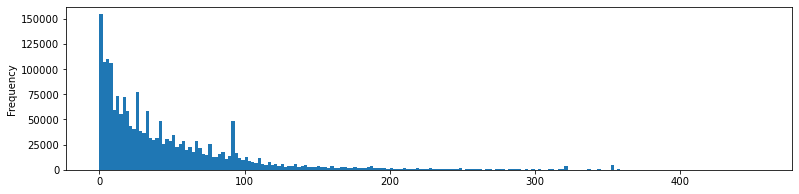

In [18]:
zoopla2.duration_1.plot.hist(bins=200, figsize=(13,3))

In [19]:
zoopla2.head()

,Unnamed: 0,property_id,property_type,lon,lat,price_last,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,start_date_new,sdate,duration,duration_1
edate,,,,,,,,,,,,,,,
2019-09-30,0,11778796,Link-detached house,-0.248750,51.390170,462,4,0,1,This gorgeous home is a fantastically spacious...,2019-09-30,2019-09-24,2019-09-24,6 days,6
2019-07-24,1,11775189,NaN,-0.257468,51.394886,577,4,0,2,A beautifully presented four bedroom semi-deta...,2019-07-24,2019-06-20,2019-06-20,34 days,34
2019-09-30,3,11792079,Flat,-0.293679,51.395220,312,1,0,1,Property Reference: 603116.A lovely one bedroo...,2019-09-30,2019-08-06,2019-08-06,55 days,55
2019-04-15,4,31614757,Flat,-0.306849,51.413830,496,2,0,1,Property Reference: 512758.No agency fees. A v...,2019-04-15,2019-02-22,2019-02-22,52 days,52
2019-02-08,5,11766153,Flat,-0.259015,51.407516,300,2,0,1,Property Reference: 489315.A two bedroom apart...,2019-02-08,2019-01-06,2019-01-06,33 days,33


In [20]:
zoopla2.duration_1.describe()

count    1.985356e+06
mean     4.687292e+01
std      5.400955e+01
min      0.000000e+00
25%      1.000000e+01
50%      2.900000e+01
75%      6.600000e+01
max      4.540000e+02
Name: duration_1, dtype: float64

In [21]:
p1= zoopla2.duration_1.quantile(0.1)

Zoopla_2= zoopla2[zoopla2['duration_1'] >= p1]

In [22]:
p1

3.0

In [23]:
print(f"Zoopla has {Zoopla_2.shape[0]:,.0f} rows.")

print(f"The range of duration is {Zoopla_2.duration_1.min():,.2f} to {Zoopla_2.duration_1.max():,.2f}")

Zoopla has 1,831,137 rows.
The range of duration is 3.00 to 454.00


In [24]:
Zoopla_3=Zoopla_2.copy()

monthly_price_all_1=Zoopla_3.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [25]:
Zoopla_3.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1831137 entries, 2019-09-30 to 2022-09-29
Data columns (total 15 columns):
 #   Column          Dtype          
---  ------          -----          
 0   Unnamed: 0      int64          
 1   property_id     int64          
 2   property_type   object         
 3   lon             float64        
 4   lat             float64        
 5   price_last      int64          
 6   num_bed_last    int64          
 7   num_floors_max  int64          
 8   num_bath_max    int64          
 9   description     object         
 10  end_date_new    object         
 11  start_date_new  object         
 12  sdate           datetime64[ns] 
 13  duration        timedelta64[ns]
 14  duration_1      int64          
dtypes: datetime64[ns](1), float64(2), int64(7), object(4), timedelta64[ns](1)
memory usage: 223.5+ MB


In [26]:
yearly_count2 = Zoopla_3.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count2

,edate,property_id
0,2019-12-31,776559
1,2020-12-31,611471
2,2021-12-31,277141
3,2022-12-31,165966


In [27]:
Zoopla_test = Zoopla_3[['property_id','start_date_new','price_last']]


In [28]:
print(Zoopla_test)

            property_id start_date_new  price_last
edate                                             
2019-09-30     11778796     2019-09-24         462
2019-07-24     11775189     2019-06-20         577
2019-09-30     11792079     2019-08-06         312
2019-04-15     31614757     2019-02-22         496
2019-02-08     11766153     2019-01-06         300
...                 ...            ...         ...
2022-11-29      7955753     2022-11-23         480
2022-11-29     33117775     2022-11-25         900
2022-12-07      7972766     2022-11-29         450
2022-12-05      7955826     2022-12-02         496
2022-09-29     32909047     2022-08-09         830

[1831137 rows x 3 columns]


In [29]:
Zoopla_test_1 = Zoopla_test.groupby(['property_id', 'start_date_new'])['price_last'].max().reset_index()

In [30]:
Zoopla_test_3 = Zoopla_3.drop_duplicates(subset=['property_id','start_date_new'],keep='first')

In [31]:
Zoopla_test_3.head()

,Unnamed: 0,property_id,property_type,lon,lat,price_last,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,start_date_new,sdate,duration,duration_1
edate,,,,,,,,,,,,,,,
2019-09-30,0,11778796,Link-detached house,-0.248750,51.390170,462,4,0,1,This gorgeous home is a fantastically spacious...,2019-09-30,2019-09-24,2019-09-24,6 days,6
2019-07-24,1,11775189,NaN,-0.257468,51.394886,577,4,0,2,A beautifully presented four bedroom semi-deta...,2019-07-24,2019-06-20,2019-06-20,34 days,34
2019-09-30,3,11792079,Flat,-0.293679,51.395220,312,1,0,1,Property Reference: 603116.A lovely one bedroo...,2019-09-30,2019-08-06,2019-08-06,55 days,55
2019-04-15,4,31614757,Flat,-0.306849,51.413830,496,2,0,1,Property Reference: 512758.No agency fees. A v...,2019-04-15,2019-02-22,2019-02-22,52 days,52
2019-02-08,5,11766153,Flat,-0.259015,51.407516,300,2,0,1,Property Reference: 489315.A two bedroom apart...,2019-02-08,2019-01-06,2019-01-06,33 days,33


In [32]:
Zoopla_test_3.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 897919 entries, 2019-09-30 to 2022-09-29
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   Unnamed: 0      897919 non-null  int64          
 1   property_id     897919 non-null  int64          
 2   property_type   847241 non-null  object         
 3   lon             897919 non-null  float64        
 4   lat             897919 non-null  float64        
 5   price_last      897919 non-null  int64          
 6   num_bed_last    897919 non-null  int64          
 7   num_floors_max  897919 non-null  int64          
 8   num_bath_max    897919 non-null  int64          
 9   description     897690 non-null  object         
 10  end_date_new    897919 non-null  object         
 11  start_date_new  897919 non-null  object         
 12  sdate           897919 non-null  datetime64[ns] 
 13  duration        897919 non-null  timedelta64[ns]
 14  dura

In [33]:
Zoopla_test_2 = Zoopla_test_1.merge(Zoopla_test_3, on=['property_id','start_date_new'], how='left')

##,'price_last'

In [34]:
Zoopla_test_2.head()

,property_id,start_date_new,price_last_x,Unnamed: 0,property_type,lon,lat,price_last_y,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,sdate,duration,duration_1
0,281626,2019-10-16,462,1135055,Terraced house,0.002911,51.535160,462,3,0,0,Spacious 3 bedroom house with contemporary des...,2019-10-22,2019-10-16,6 days,6
1,578819,2021-02-06,945,456859,Flat,-0.083377,51.509060,945,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-06,13 days,13
2,578819,2021-02-13,945,456880,Flat,-0.084017,51.509148,945,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-13,6 days,6
3,652324,2019-01-08,185,320340,Studio,-0.197458,51.597450,185,0,0,1,A brand new first floor Studio flat with easy ...,2019-04-03,2019-01-08,85 days,85
4,652324,2019-03-14,185,319995,Studio,-0.197458,51.597450,185,0,0,1,A brand new first floor studio apartment sit...,2019-04-01,2019-03-14,18 days,18


In [35]:
Zoopla_test_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 897919 entries, 0 to 897918
Data columns (total 16 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     897919 non-null  int64          
 1   start_date_new  897919 non-null  object         
 2   price_last_x    897919 non-null  int64          
 3   Unnamed: 0      897919 non-null  int64          
 4   property_type   847241 non-null  object         
 5   lon             897919 non-null  float64        
 6   lat             897919 non-null  float64        
 7   price_last_y    897919 non-null  int64          
 8   num_bed_last    897919 non-null  int64          
 9   num_floors_max  897919 non-null  int64          
 10  num_bath_max    897919 non-null  int64          
 11  description     897690 non-null  object         
 12  end_date_new    897919 non-null  object         
 13  sdate           897919 non-null  datetime64[ns] 
 14  duration        8979

In [36]:
Zoopla_test_2=Zoopla_test_2.drop(columns=['Unnamed: 0','price_last_y'])

In [37]:
Zoopla_test_2 = Zoopla_test_2.rename(columns={'price_last_x': 'price_last'})

In [38]:
Zoopla_test_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 897919 entries, 0 to 897918
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     897919 non-null  int64          
 1   start_date_new  897919 non-null  object         
 2   price_last      897919 non-null  int64          
 3   property_type   847241 non-null  object         
 4   lon             897919 non-null  float64        
 5   lat             897919 non-null  float64        
 6   num_bed_last    897919 non-null  int64          
 7   num_floors_max  897919 non-null  int64          
 8   num_bath_max    897919 non-null  int64          
 9   description     897690 non-null  object         
 10  end_date_new    897919 non-null  object         
 11  sdate           897919 non-null  datetime64[ns] 
 12  duration        897919 non-null  timedelta64[ns]
 13  duration_1      897919 non-null  int64          
dtypes: datetime64[ns](1)

In [39]:
# Zoopla_test_5 = Zoopla_test_2.drop_duplicates(subset=['property_id','price_last'],keep='first')

In [40]:
#Zoopla_4=Zoopla_test_5.copy()
Zoopla_4=Zoopla_test_2.copy()
Zoopla_4['edate']=pd.to_datetime(Zoopla_4['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_4.set_index('edate',inplace=True)

monthly_price=Zoopla_4.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [41]:
yearly_count3 = Zoopla_4.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count3

,edate,property_id
0,2019-12-31,252155
1,2020-12-31,239826
2,2021-12-31,252312
3,2022-12-31,153626


In [42]:
#Zoopla_test_6=Zoopla_test_5.dropna()
Zoopla_test_6=Zoopla_test_2.dropna()

In [43]:
Zoopla_5=Zoopla_test_6.copy()
Zoopla_5['edate']=pd.to_datetime(Zoopla_5['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_5.set_index('edate',inplace=True)



In [44]:
monthly_price_dropna=Zoopla_5.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [45]:
Zoopla_5.head()

,property_id,start_date_new,price_last,property_type,lon,lat,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,sdate,duration,duration_1
edate,,,,,,,,,,,,,,
2019-10-22,281626,2019-10-16,462,Terraced house,0.002911,51.535160,3,0,0,Spacious 3 bedroom house with contemporary des...,2019-10-22,2019-10-16,6 days,6
2021-02-19,578819,2021-02-06,945,Flat,-0.083377,51.509060,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-06,13 days,13
2021-02-19,578819,2021-02-13,945,Flat,-0.084017,51.509148,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,2021-02-13,6 days,6
2019-04-03,652324,2019-01-08,185,Studio,-0.197458,51.597450,0,0,1,A brand new first floor Studio flat with easy ...,2019-04-03,2019-01-08,85 days,85
2019-04-01,652324,2019-03-14,185,Studio,-0.197458,51.597450,0,0,1,A brand new first floor studio apartment sit...,2019-04-01,2019-03-14,18 days,18


In [46]:
yearly_count4 =Zoopla_5.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count4

,edate,property_id
0,2019-12-31,235076
1,2020-12-31,226262
2,2021-12-31,239792
3,2022-12-31,145919


### delet outliers

In [47]:
print(f"Zoopla has {Zoopla_5.shape[0]:,.0f} rows.")

print(f"The range of price is {Zoopla_5.price_last.min():,.2f} to {Zoopla_5.price_last.max():,.2f}")
print(f"The range of bedroom numer is {Zoopla_5.num_bed_last.min():,.2f} to {Zoopla_5.num_bed_last.max():,.2f}")
print(f"The range of bathroom numer is {Zoopla_5.num_bath_max.min():,.2f} to {Zoopla_5.num_bath_max.max():,.2f}")

Zoopla has 847,049 rows.
The range of price is 0.00 to 79,846.00
The range of bedroom numer is 0.00 to 255.00
The range of bathroom numer is 0.00 to 186.00


<AxesSubplot:ylabel='Frequency'>

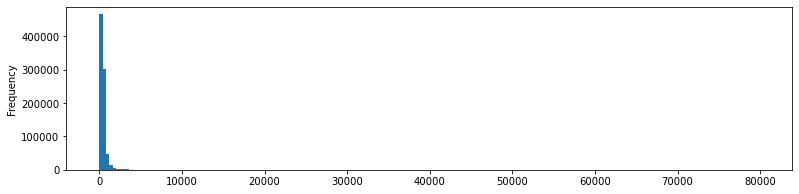

In [48]:
Zoopla_5.price_last.plot.hist(bins=200, figsize=(13,3))

(0.0, 2500.0)

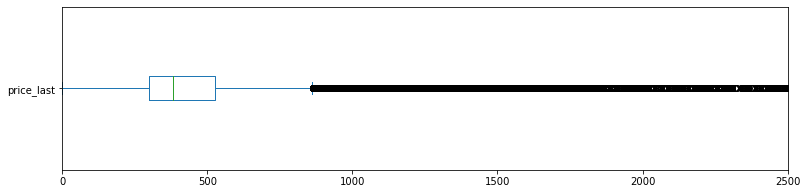

In [49]:
ax = Zoopla_5.price_last.plot.box(vert=False, figsize=(13,3))
ax.set_xlim(0,2500)

In [50]:
Zoopla_5.price_last.describe()

count    847049.000000
mean        491.059580
std         669.805813
min           0.000000
25%         300.000000
50%         381.000000
75%         525.000000
max       79846.000000
Name: price_last, dtype: float64

In [51]:
Zoopla_5['lnprice'] = np.log(Zoopla_5.price_last)

C:\Program Files\Anaconda3\lib\site-packages\pandas\core\arraylike.py:397: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [52]:
Zoopla_6 = Zoopla_5.copy()

In [53]:
q1 = Zoopla_6.lnprice.quantile(0.25)
q3 = Zoopla_6.lnprice.quantile(0.75)
iqr = q3 - q1
Zoopla_6 = Zoopla_6[(Zoopla_6['lnprice'] >= q1 - 2 * iqr) & (Zoopla_6['lnprice'] <= q3 + 2 * iqr)]

In [54]:
Zoopla_6.price_last.describe()

count    829511.000000
mean        437.887275
std         229.635721
min          98.000000
25%         299.000000
50%         375.000000
75%         508.000000
max        1606.000000
Name: price_last, dtype: float64

In [55]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     829511 non-null  int64          
 1   start_date_new  829511 non-null  object         
 2   price_last      829511 non-null  int64          
 3   property_type   829511 non-null  object         
 4   lon             829511 non-null  float64        
 5   lat             829511 non-null  float64        
 6   num_bed_last    829511 non-null  int64          
 7   num_floors_max  829511 non-null  int64          
 8   num_bath_max    829511 non-null  int64          
 9   description     829511 non-null  object         
 10  end_date_new    829511 non-null  object         
 11  sdate           829511 non-null  datetime64[ns] 
 12  duration        829511 non-null  timedelta64[ns]
 13  duration_1      829511 non-null  int64          
 14  lnpr

In [56]:
Zoopla_7=Zoopla_6.copy()
Zoopla_7['edate']=pd.to_datetime(Zoopla_7['end_date_new'],format='%Y-%m-%d',errors='coerce')
Zoopla_7.set_index('edate',inplace=True)

monthly_price_drop_outliers=Zoopla_7.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [57]:
yearly_count5 =Zoopla_7.groupby(pd.Grouper(freq='Y')).property_id.count().reset_index()
yearly_count5

,edate,property_id
0,2019-12-31,230436
1,2020-12-31,222164
2,2021-12-31,235865
3,2022-12-31,141046


In [58]:
monthly_count = Zoopla_7.groupby(pd.Grouper(freq='M')).property_id.count().reset_index()

### monthly change plot

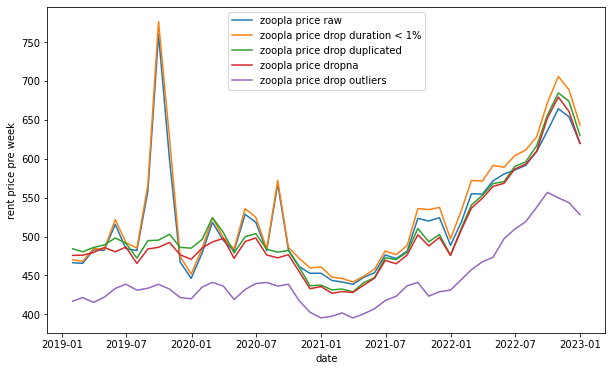

In [59]:
fig,ax=plt.subplots(figsize=(10,6))

ax.set_xlabel("date")
ax.set_ylabel("rent price pre week")
#ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price_all_1['edate'], monthly_price_all_1.price_last,label='zoopla price drop duration < 1%')
ax.plot(monthly_price['edate'], monthly_price.price_last,label='zoopla price drop duplicated')
ax.plot(monthly_price_dropna['edate'],monthly_price_dropna.price_last,label='zoopla price dropna')
ax.plot(monthly_price_drop_outliers['edate'], monthly_price_drop_outliers.price_last,label='zoopla price drop outliers')
plt.legend()
plt.show()

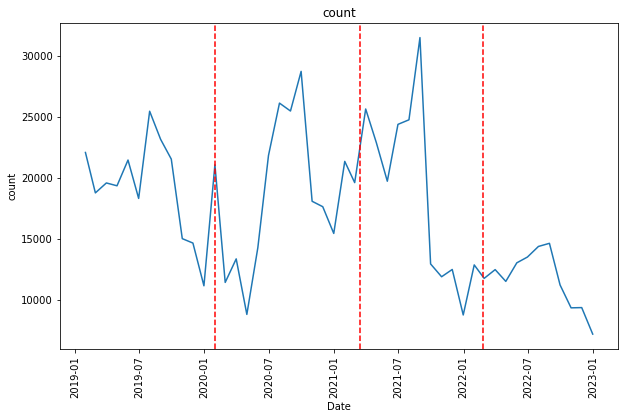

In [60]:
x = monthly_count['edate']
y = monthly_count['property_id']

# Create the figure with the desired size
plt.figure(figsize=(10, 6))

# Plot the data
plt.plot(x, y)

# Add title and axis labels
plt.title('count')
plt.xlabel('Date')
plt.ylabel('count')

# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2020-01-31'), pd.to_datetime('2021-03-16'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08'), pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')

# Plot the blue vertical lines
#for date in vertical_line_dates2:
    #plt.axvline(x=date, color='blue', linestyle='--')

# Display the plot
plt.show()

In [61]:
monthly_price['growth_rate'] = monthly_price['price_last'].pct_change() * 100
monthly_price

,edate,price_last,growth_rate
0,2019-01-31,484.353654,NaN
1,2019-02-28,480.445569,-0.806866
2,2019-03-31,485.982249,1.152405
3,2019-04-30,489.272903,0.677114
4,2019-05-31,498.220786,1.828812
5,2019-06-30,491.488289,-1.351308
6,2019-07-31,472.283758,-3.907424
7,2019-08-31,494.763464,4.759788
8,2019-09-30,495.365736,0.121729
9,2019-10-31,502.992293,1.539581


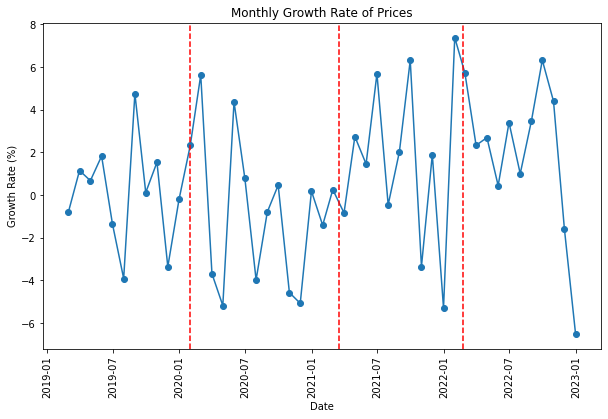

In [62]:
plt.figure(figsize=(10, 6))
plt.plot(monthly_price['edate'], monthly_price['growth_rate'], marker='o', linestyle='-')
plt.title('Monthly Growth Rate of Prices')
plt.xlabel('Date')
plt.ylabel('Growth Rate (%)')
plt.xticks(rotation='vertical')
# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2020-01-31'), pd.to_datetime('2021-03-16'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08'), pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')

# Plot the blue vertical lines
#for date in vertical_line_dates2:
    #plt.axvline(x=date, color='blue', linestyle='--')

# Display the plot
plt.show()

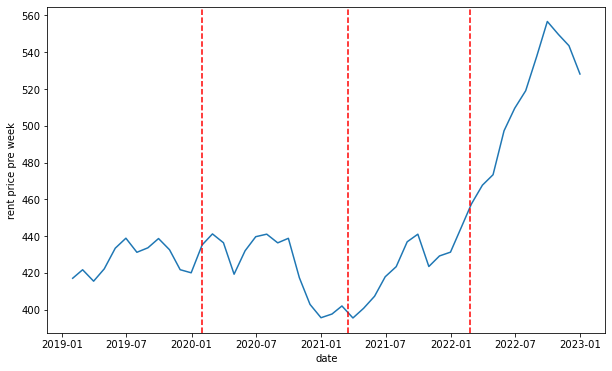

In [63]:
fig,ax=plt.subplots(figsize=(10,6))

ax.set_xlabel("date")
ax.set_ylabel("rent price pre week")
ax.plot(monthly_price_drop_outliers['edate'],monthly_price_drop_outliers.price_last,label='zoopla price drop outliers')
# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2020-01-31'), pd.to_datetime('2021-03-16'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08'), pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')

# Plot the blue vertical lines
#for date in vertical_line_dates2:
    #plt.axvline(x=date, color='blue', linestyle='--')

# Display the plot
plt.show()

In [64]:
monthly_price_drop_outliers

,edate,price_last
0,2019-01-31,417.041944
1,2019-02-28,421.668906
2,2019-03-31,415.452056
3,2019-04-30,422.157481
4,2019-05-31,433.387770
5,2019-06-30,438.827151
6,2019-07-31,431.169376
7,2019-08-31,433.599922
8,2019-09-30,438.645103
9,2019-10-31,432.544327


<AxesSubplot:ylabel='Frequency'>

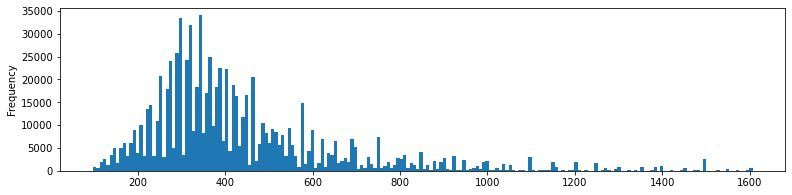

In [65]:
Zoopla_6.price_last.plot.hist(bins=200, figsize=(13,3))

<AxesSubplot:ylabel='Frequency'>

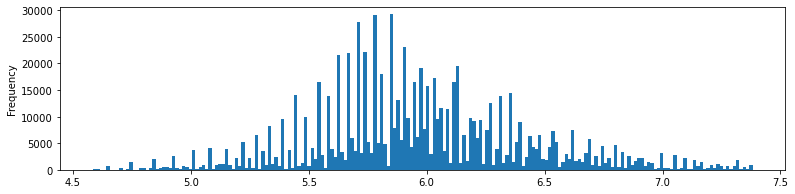

In [66]:
Zoopla_6.lnprice.plot.hist(bins=200,figsize=(13,3))

In [67]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     829511 non-null  int64          
 1   start_date_new  829511 non-null  object         
 2   price_last      829511 non-null  int64          
 3   property_type   829511 non-null  object         
 4   lon             829511 non-null  float64        
 5   lat             829511 non-null  float64        
 6   num_bed_last    829511 non-null  int64          
 7   num_floors_max  829511 non-null  int64          
 8   num_bath_max    829511 non-null  int64          
 9   description     829511 non-null  object         
 10  end_date_new    829511 non-null  object         
 11  sdate           829511 non-null  datetime64[ns] 
 12  duration        829511 non-null  timedelta64[ns]
 13  duration_1      829511 non-null  int64          
 14  lnpr

In [68]:
t1 = pd.to_datetime('2020-03-16')
t2 = pd.to_datetime('2020-09-22')
t3 = pd.to_datetime('2021-02-22')
t4 = pd.to_datetime('2022-02-24')
# Create boolean masks for 'post', 'pre', and 'during' periods
Zoopla_6['edate']=pd.to_datetime(Zoopla_6['end_date_new'],format='%Y-%m-%d',errors='coerce')

pre_mask = Zoopla_6['edate'] < t1

during_mask = (Zoopla_6['edate'] >= t1) & (Zoopla_6['edate'] <= t3)
during1_mask = (Zoopla_6['edate'] > t1) & (Zoopla_6['edate'] <= t2)
during2_mask = (Zoopla_6['edate'] > t2) & (Zoopla_6['edate'] <= t3)

post_mask = Zoopla_6['edate'] > t3
post2_mask = Zoopla_6['edate'] > t4
post1_mask = (Zoopla_6['edate'] > t3) & (Zoopla_6['edate'] <= t4)

# Assign 0 or 1 based on the boolean masks to new columns 'post', 'pre', and 'during'
Zoopla_6['during1'] = during1_mask.astype(int)
Zoopla_6['during2'] = during2_mask.astype(int)
Zoopla_6['post'] = post_mask.astype(int)
Zoopla_6['post2'] = post2_mask.astype(int)
Zoopla_6['post1'] = post1_mask.astype(int)
Zoopla_6['pre'] = pre_mask.astype(int)
Zoopla_6['during'] = during_mask.astype(int)


In [ ]:
Zoopla_6.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829511 entries, 2019-10-22 to 2022-11-14
Data columns (total 23 columns):
 #   Column          Non-Null Count   Dtype          
---  ------          --------------   -----          
 0   property_id     829511 non-null  int64          
 1   start_date_new  829511 non-null  object         
 2   price_last      829511 non-null  int64          
 3   property_type   829511 non-null  object         
 4   lon             829511 non-null  float64        
 5   lat             829511 non-null  float64        
 6   num_bed_last    829511 non-null  int64          
 7   num_floors_max  829511 non-null  int64          
 8   num_bath_max    829511 non-null  int64          
 9   description     829511 non-null  object         
 10  end_date_new    829511 non-null  object         
 11  sdate           829511 non-null  datetime64[ns] 
 12  duration        829511 non-null  timedelta64[ns]
 13  duration_1      829511 non-null  int64          
 14  lnpr

In [ ]:
Zoopla_6.head()

,property_id,start_date_new,price_last,property_type,lon,lat,num_bed_last,num_floors_max,num_bath_max,description,...,duration_1,lnprice,edate,during1,during2,post,post2,post1,pre,during
edate,,,,,,,,,,,,,,,,,,,,,
2019-10-22,281626,2019-10-16,462,Terraced house,0.002911,51.535160,3,0,0,Spacious 3 bedroom house with contemporary des...,...,6,6.135565,2019-10-22,0,0,0,0,0,1,0
2021-02-19,578819,2021-02-06,945,Flat,-0.083377,51.509060,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,...,13,6.851185,2021-02-19,0,1,0,0,0,0,1
2021-02-19,578819,2021-02-13,945,Flat,-0.084017,51.509148,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,...,6,6.851185,2021-02-19,0,1,0,0,0,0,1
2019-04-03,652324,2019-01-08,185,Studio,-0.197458,51.597450,0,0,1,A brand new first floor Studio flat with easy ...,...,85,5.220356,2019-04-03,0,0,0,0,0,1,0
2019-04-01,652324,2019-03-14,185,Studio,-0.197458,51.597450,0,0,1,A brand new first floor studio apartment sit...,...,18,5.220356,2019-04-01,0,0,0,0,0,1,0


In [ ]:
Zoopla_6=Zoopla_6.drop(columns=['duration','edate','sdate'])

In [69]:
Zoopla_6.to_csv('Zoopla_6_0822.csv')

### price change in diff covid priod

In [70]:
pre = Zoopla_6[Zoopla_6['pre'] == 1]  # Filter the DataFrame based on the 'post' condition (where post is 1)
pre_description = pre['price_last'].describe()
print(pre_description)


count    270438.000000
mean        429.301662
std         228.861101
min          98.000000
25%         288.000000
50%         369.000000
75%         500.000000
max        1604.000000
Name: price_last, dtype: float64


In [71]:
during= Zoopla_6[Zoopla_6['during'] == 1]  # Filter the DataFrame based on the 'post' condition (where post is 1)
during_description = during['price_last'].describe()
print(during_description)


count    218936.000000
mean        422.920278
std         213.008301
min          98.000000
25%         294.000000
50%         369.000000
75%         495.000000
max        1604.000000
Name: price_last, dtype: float64


In [72]:
post = Zoopla_6[Zoopla_6['post'] == 1]  
post_description = post['price_last'].describe()
print(post_description)


count    340137.000000
mean        454.347378
std         239.330202
min          98.000000
25%         300.000000
50%         390.000000
75%         531.000000
max        1606.000000
Name: price_last, dtype: float64


In [73]:
post1 = Zoopla_6[Zoopla_6['post1'] == 1]  
post1_description = post1['price_last'].describe()
print(post1_description)

count    222305.000000
mean        421.821448
std         217.496711
min          98.000000
25%         288.000000
50%         368.000000
75%         485.000000
max        1606.000000
Name: price_last, dtype: float64


In [74]:
post2 = Zoopla_6[Zoopla_6['post2'] == 1]  
post2_description = post2['price_last'].describe()
print(post2_description)

count    117832.000000
mean        515.711666
std         265.208229
min          98.000000
25%         335.000000
50%         438.000000
75%         623.000000
max        1606.000000
Name: price_last, dtype: float64


### diff type price change in diff period

In [75]:
type_count=Zoopla_6.groupby('property_type').property_id.agg(Count='count').reset_index()
type_count=type_count.sort_values(by='Count',ascending=False).reset_index()
type_count

,index,property_type,Count
0,15,Flat,581673
1,33,Studio,82392
2,35,Terraced house,64882
3,32,Semi-detached house,34481
4,22,Maisonette,28499
5,9,Detached house,12888
6,10,End terrace house,11773
7,36,Town house,5006
8,23,Mews house,2456
9,2,Bungalow,1728


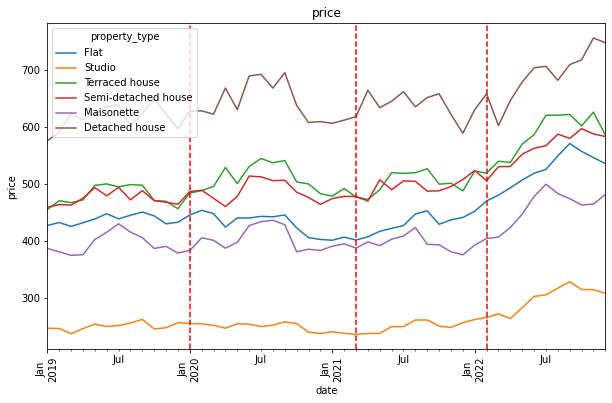

In [239]:
Zoopla_6['edate']=pd.to_datetime(Zoopla_6['end_date_new'],format='%Y-%m-%d',errors='coerce')

monthly_price2=Zoopla_6.groupby(['property_type',pd.Grouper(key='edate',freq='M')])['price_last'].mean()

pivot_table = monthly_price2.unstack(level=0)

pivot_table1=pivot_table.iloc[:,[15,33,35,32,22,9]]

ax=pivot_table1.plot(figsize=(10,6))
plt.title('price')
plt.xlabel('Date')
plt.ylabel('Rental Price')
plt.xticks(rotation='vertical')
vertical_line_dates1 = [pd.to_datetime('2020-01-31'), pd.to_datetime('2021-03-16'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08'), pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--, label='Time Period Break')


# Display the plot
plt.show()

In [77]:
import pandas as pd
from tabulate import tabulate


property_types = ['Flat', 'Studio', 'Terraced house', 'Semi-detached house', 'Maisonette', 'Detached house', 'End terrace house']

during_stats = pd.DataFrame(columns=['Property Type', 'Description'])

for prop_type in property_types:
    during_data = Zoopla_6[(Zoopla_6['property_type'] == prop_type) & (Zoopla_6['pre'] == 1)]
    during_description = during_data['price_last'].mean()
    during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)

print(tabulate(during_stats, headers='keys', tablefmt='psql', showindex=False))


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2181215073.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2181215073.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2181215073.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Loc

+---------------------+---------------+
| Property Type       |   Description |
|---------------------+---------------|
| Flat                |       439.062 |
| Studio              |       250.018 |
| Terraced house      |       481.351 |
| Semi-detached house |       476.121 |
| Maisonette          |       396.586 |
| Detached house      |       617.526 |
| End terrace house   |       437.101 |
+---------------------+---------------+


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2181215073.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2181215073.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)


In [78]:

property_types = ['Flat', 'Studio', 'Terraced house', 'Semi-detached house', 'Maisonette', 'Detached house', 'End terrace house']

during_stats = pd.DataFrame(columns=['Property Type', 'Description'])

for prop_type in property_types:
    during_data = Zoopla_6[(Zoopla_6['property_type'] == prop_type) & (Zoopla_6['during'] == 1)]
    during_description = during_data['price_last'].mean()
    during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)

print(tabulate(during_stats, headers='keys', tablefmt='psql', showindex=False))


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2005237132.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2005237132.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2005237132.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\

+---------------------+---------------+
| Property Type       |   Description |
|---------------------+---------------|
| Flat                |       427.141 |
| Studio              |       248.002 |
| Terraced house      |       516.801 |
| Semi-detached house |       491.694 |
| Maisonette          |       408.296 |
| Detached house      |       653.402 |
| End terrace house   |       479.773 |
+---------------------+---------------+


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2005237132.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)


In [79]:
import pandas as pd
from tabulate import tabulate

# 假设 Zoopla2 是你的数据框
property_types = ['Flat', 'Studio', 'Terraced house', 'Semi-detached house', 'Maisonette', 'Detached house', 'End terrace house']

during_stats = pd.DataFrame(columns=['Property Type', 'Description'])

for prop_type in property_types:
    during_data = Zoopla_6[(Zoopla_6['property_type'] == prop_type) & (Zoopla_6['post1'] == 1)]
    during_description = during_data['price_last'].mean()
    during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)

print(tabulate(during_stats, headers='keys', tablefmt='psql', showindex=False))


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3138705089.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3138705089.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3138705089.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Loc

+---------------------+---------------+
| Property Type       |   Description |
|---------------------+---------------|
| Flat                |       428.661 |
| Studio              |       248.72  |
| Terraced house      |       504.114 |
| Semi-detached house |       495.705 |
| Maisonette          |       398.369 |
| Detached house      |       639.18  |
| End terrace house   |       472.813 |
+---------------------+---------------+


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3138705089.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3138705089.py:12: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)


In [80]:

property_types = ['Flat', 'Studio', 'Terraced house', 'Semi-detached house', 'Maisonette', 'Detached house', 'End terrace house']

during_stats = pd.DataFrame(columns=['Property Type', 'Description'])

for prop_type in property_types:
    during_data = Zoopla_6[(Zoopla_6['property_type'] == prop_type) & (Zoopla_6['post2'] == 1)]
    during_description = during_data['price_last'].mean()
    during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)

print(tabulate(during_stats, headers='keys', tablefmt='psql', showindex=False))

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\1375282691.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\1375282691.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\1375282691.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\

+---------------------+---------------+
| Property Type       |   Description |
|---------------------+---------------|
| Flat                |       526.293 |
| Studio              |       296.48  |
| Terraced house      |       591.241 |
| Semi-detached house |       566.699 |
| Maisonette          |       460.68  |
| Detached house      |       693.476 |
| End terrace house   |       539.403 |
+---------------------+---------------+


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\1375282691.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\1375282691.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)


In [81]:
property_types = ['Flat', 'Studio', 'Terraced house', 'Semi-detached house', 'Maisonette', 'Detached house', 'End terrace house']

during_stats = pd.DataFrame(columns=['Property Type', 'Description'])

for prop_type in property_types:
    during_data = Zoopla_6[(Zoopla_6['property_type'] == prop_type) & (Zoopla_6['post'] == 1)]
    during_description = during_data['price_last'].mean()
    during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)

print(tabulate(during_stats, headers='keys', tablefmt='psql', showindex=False))

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2472705853.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2472705853.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2472705853.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\

+---------------------+---------------+
| Property Type       |   Description |
|---------------------+---------------|
| Flat                |       461.762 |
| Studio              |       263.875 |
| Terraced house      |       537.244 |
| Semi-detached house |       525.195 |
| Maisonette          |       419.547 |
| Detached house      |       663.742 |
| End terrace house   |       498.641 |
+---------------------+---------------+


C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2472705853.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2472705853.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  during_stats = during_stats.append({'Property Type': prop_type, 'Description': during_description}, ignore_index=True)


### boro change plt

In [20]:
from tabulate import tabulate
from matplotlib.colors import ListedColormap
import contextily
import matplotlib.cm as cm
import matplotlib as mpl
import geopandas as gpd
import statsmodels.api as sm
import os
import matplotlib.colors as mcolors

In [5]:
current_dir = os.getcwd()
relative_path = 'london_lsoa_shp/LSOA_2011_London_gen_MHW.shp'
file_path = os.path.join(current_dir, relative_path)
lsoashp = gpd.read_file(file_path)

In [6]:
lsoashp=lsoashp.to_crs('epsg:27700')

In [7]:
current_dir = os.getcwd()
relative_path = 'data/geo/Boroughs.gpkg'
file_path = os.path.join(current_dir, relative_path)
boros = gpd.read_file(file_path)

In [13]:
boro_price = pd.read_csv('boro_price.csv')

In [14]:
lsoa_price = pd.read_csv('lsoa_price.csv')

In [17]:
lsoa_price.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4826 entries, 0 to 4825
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   LSOA11NM           4826 non-null   object 
 1   lsoa_price         4826 non-null   float64
 2   pre_price          4818 non-null   float64
 3   during_price       4777 non-null   float64
 4   post_price         4818 non-null   float64
 5   post1_price        4807 non-null   float64
 6   post2_price        4786 non-null   float64
 7   diff_pre_during    4775 non-null   float64
 8   diff_during_post   4774 non-null   float64
 9   diff_during_post1  4765 non-null   float64
 10  diff_post1_post2   4775 non-null   float64
dtypes: float64(10), object(1)
memory usage: 414.9+ KB


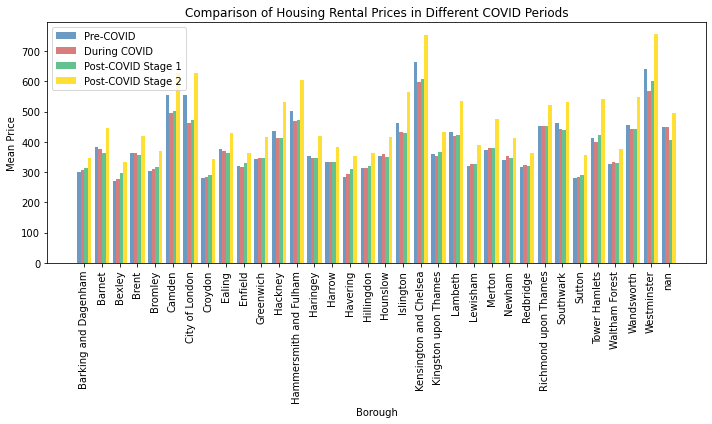

In [9]:
x_data = boro_price['LAD11NM']
y_data_pre = boro_price['pre_price']
y_data_during = boro_price['during_price']
y_data_post1 = boro_price['post1_price']
y_data_post2 = boro_price['post2_price']

# Set bar width
bar_width = 0.2

# Create a figure and axis
fig, ax = plt.subplots(figsize=(10, 6))

# Pre-COVID data
ax.bar(x=np.arange(len(x_data)), height=y_data_pre, label='Pre-COVID',
       color='steelblue', alpha=0.8, width=bar_width)

# During COVID data
ax.bar(x=np.arange(len(x_data)) + bar_width, height=y_data_during,
       label='During COVID', color='indianred', alpha=0.8, width=bar_width)

# Post-COVID Stage 2 data
ax.bar(x=np.arange(len(x_data)) + 2 * bar_width, height=y_data_post1,
       label='Post-COVID Stage 1', color='mediumseagreen', alpha=0.8, width=bar_width)

# Post-COVID Stage 1 data
ax.bar(x=np.arange(len(x_data)) + 3 * bar_width, height=y_data_post2,
       label='Post-COVID Stage 2', color='gold', alpha=0.8, width=bar_width)

# Horizontal axis
ax.set_xticks(np.arange(len(x_data)) + 1.5 * bar_width)
ax.set_xticklabels(boro_price['LAD11NM'], fontsize=10, rotation=90)

ax.set_title("Comparison of Housing Rental Prices in Different COVID Periods")
ax.set_xlabel("Borough")
ax.set_ylabel("Mean Price")

ax.legend()

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()


In [79]:
price_join = boros.merge(boro_price, left_on=['NAME'], right_on=['LAD11NM'],how='left')


In [18]:
price_lsoa_join = lsoashp.merge(lsoa_price, left_on=['LSOA11NM'], right_on=['LSOA11NM'],how='left')

#### boro

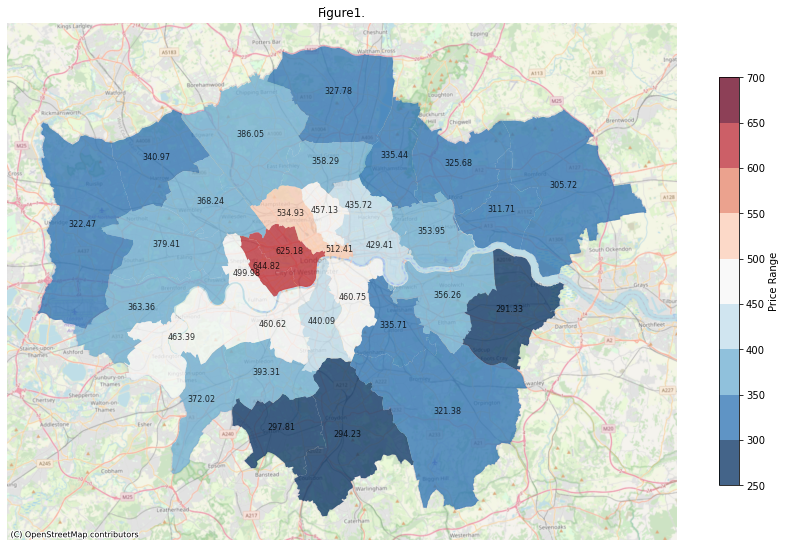

In [167]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='boro_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
for idx, row in price_join.iterrows():
    price = row['boro_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=8, ha='center', alpha=0.8)  # Rounded to 2 decimal places


ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


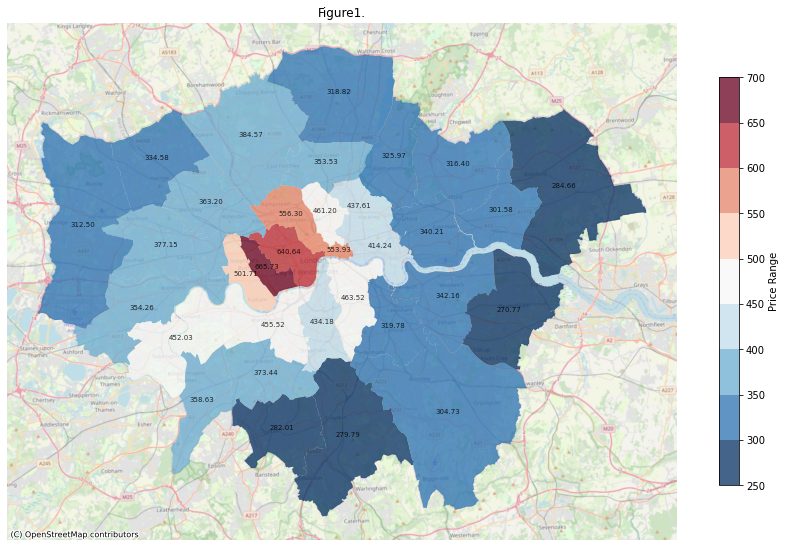

In [168]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='pre_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

for idx, row in price_join.iterrows():
    price = row['pre_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=7, ha='center', alpha=0.8)  # Rounded to 2 decimal places

# Plot the borough boundaries

#boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)


ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


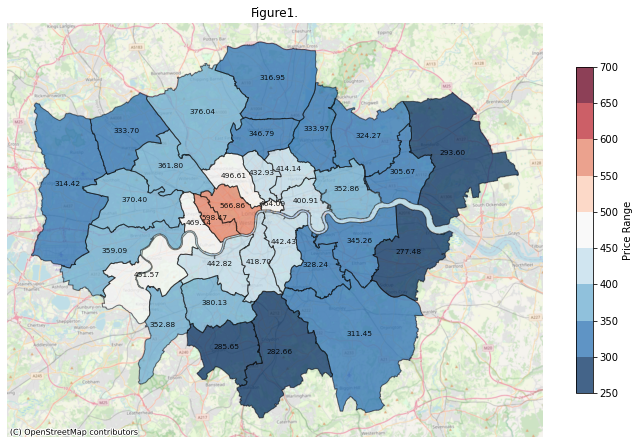

In [160]:

# Define the boundaries for the legend segments
#legend_bins = [200,300,400,500,600,700,800]
legend_bins = [250,300,350,400,450,500,550,600,650,700]
# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_join.plot(                 
    column='during_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['during_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=7.5, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
# boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


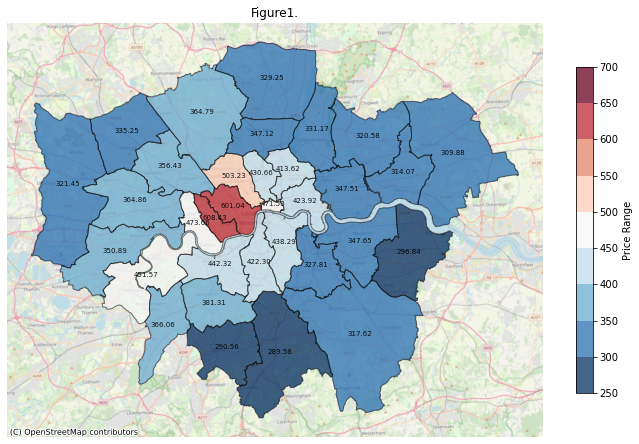

In [154]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(12, 12))
price_join.plot(                 
    column='post1_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['post1_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=7, ha='center', alpha=0.9)  # Rounded to 2 decimal places


# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


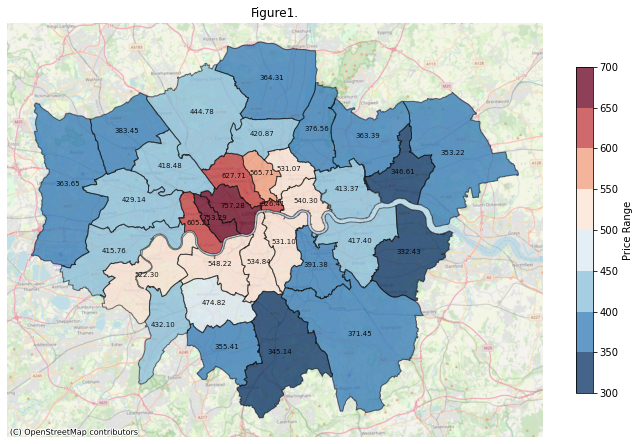

In [150]:

# Define the boundaries for the legend segments
legend_bins = [250,300,350,400,450,500,550,600,650,700]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(12, 12))
price_join.plot(                 
    column='post2_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['post2_price']
    ax.annotate(text=f"{price:.2f}", xy=row['geometry'].centroid.coords[0], fontsize=7, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


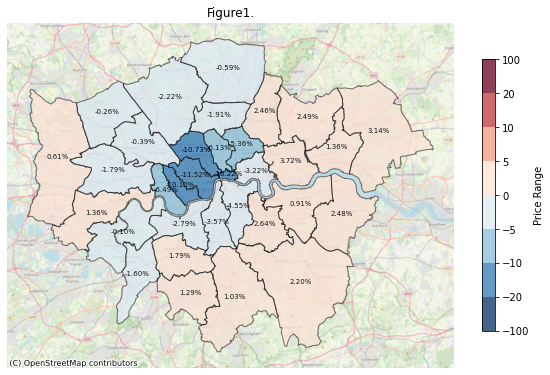

In [156]:

# Define the boundaries for the legend segments
legend_bins = [-100,-20, -10, -5,0, 5, 10,20, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(10, 10))
price_join.plot(                 
    column='diff_pre_during', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['diff_pre_during']
    ax.annotate(text=f"{price:.2f}%", xy=row['geometry'].centroid.coords[0], fontsize=7, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


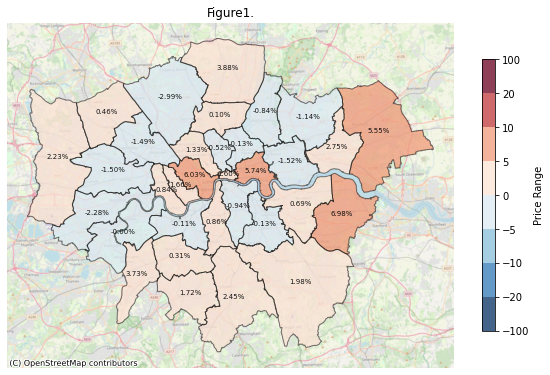

In [157]:

# Define the boundaries for the legend segments
legend_bins = [-100,-20, -10, -5,0, 5, 10,20, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(10, 10))
price_join.plot(                 
    column='diff_during_post1', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

for idx, row in price_join.iterrows():
    price = row['diff_during_post1']
    ax.annotate(text=f"{price:.2f}%", xy=row['geometry'].centroid.coords[0], fontsize=7, ha='center', alpha=0.9)  # Rounded to 2 decimal places


# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


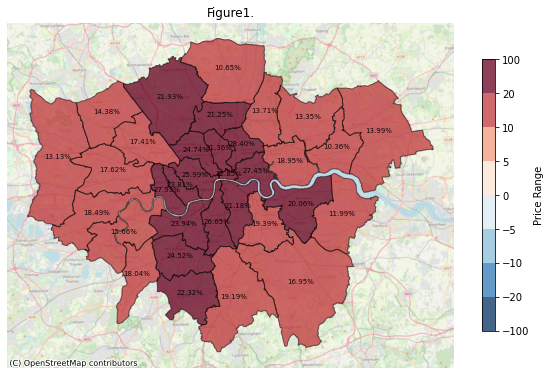

In [158]:

# Define the boundaries for the legend segments
legend_bins = [-100,-20, -10, -5,0, 5, 10,20, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(10, 10))
price_join.plot(                 
    column='diff_post1_post2', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)
for idx, row in price_join.iterrows():
    price = row['diff_post1_post2']
    ax.annotate(text=f"{price:.2f}%", xy=row['geometry'].centroid.coords[0], fontsize=7, ha='center', alpha=0.9)  # Rounded to 2 decimal places

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


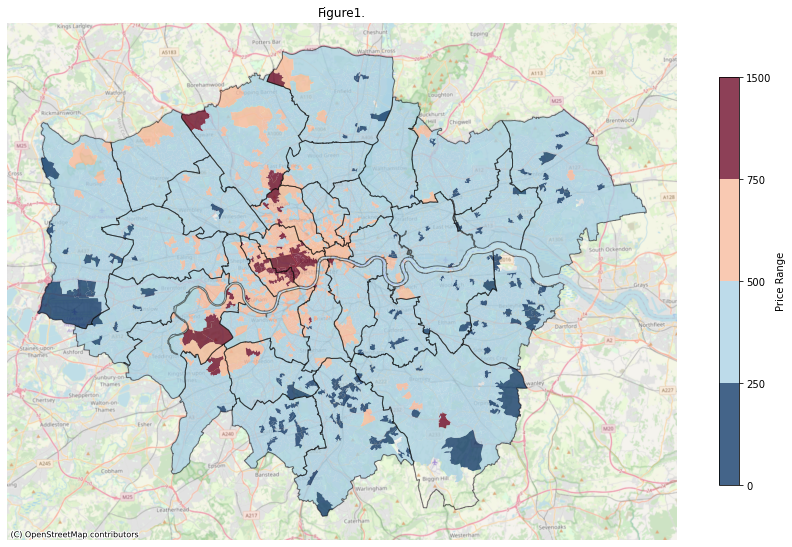

In [161]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='pre_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


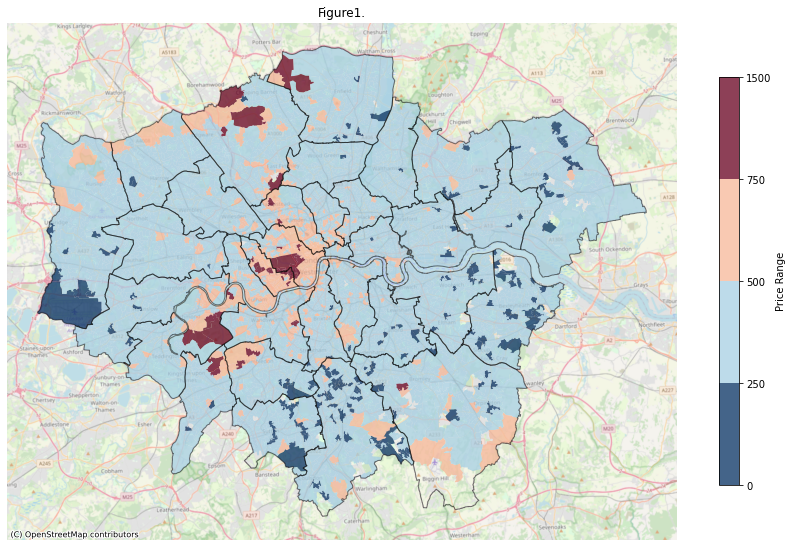

In [162]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='during_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


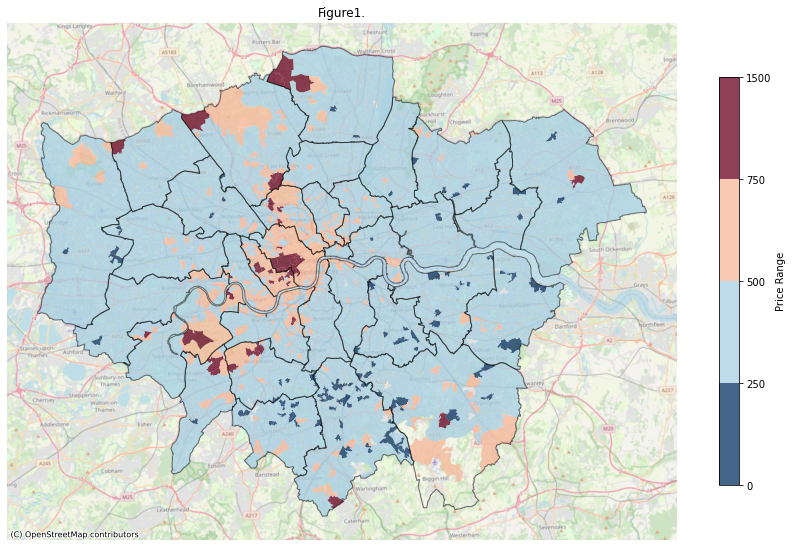

In [163]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='post1_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


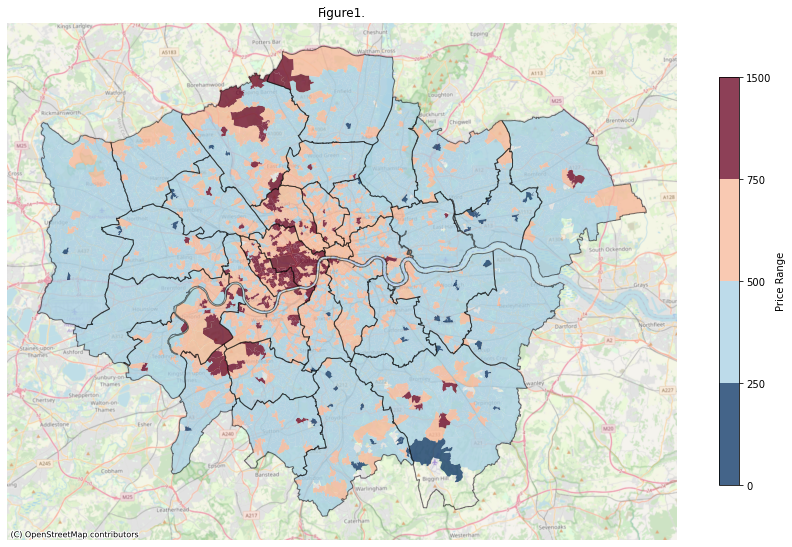

In [164]:

# Define the boundaries for the legend segments
legend_bins = [0, 250,  500,  750, 1500]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed() 

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='post2_price', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Figure1.")

# Add the segmented legend
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_label('Price Range')

contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik,
    alpha=0.75
)

plt.show()


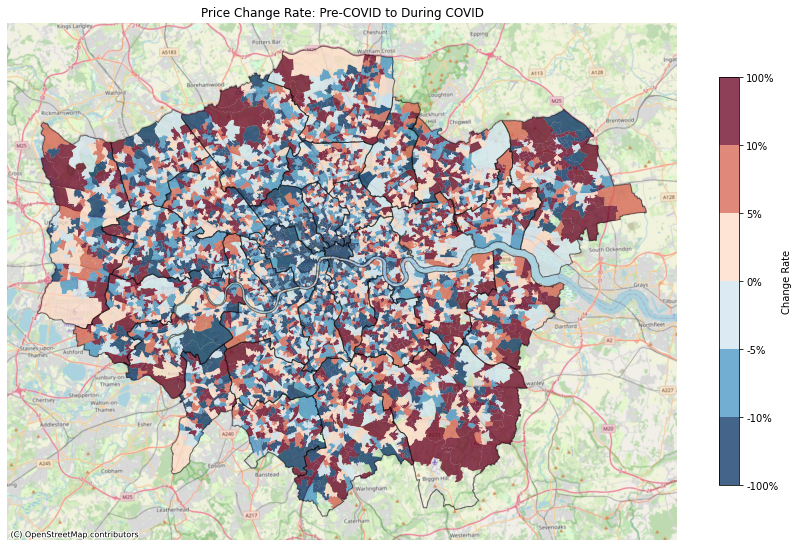

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import contextily

# Define the boundaries for the legend segments (change rate as percentages)
legend_bins = [-100, -10, -5,0, 5, 10, 100]

# Create a custom color map (RdBu) with the same number of colors as legend bins
cmap = plt.get_cmap('RdBu', len(legend_bins) - 1)
cmap_reversed = cmap.reversed()

# Create a BoundaryNorm to segment the colors in the color map
norm = mcolors.BoundaryNorm(legend_bins, cmap.N)

f, ax = plt.subplots(1, figsize=(15, 15))
price_lsoa_join.plot(                 
    column='diff_pre_during', 
    cmap=cmap_reversed,  # Use the reversed colormap
    edgecolor='none', 
    ax=ax,
    alpha=0.75,
    norm=norm  # Apply the BoundaryNorm to the plot
)

# Plot the borough boundaries
boros.boundary.plot(ax=ax, color='black', alpha=0.5, linewidth=1)

ax.set_axis_off()
ax.set_title("Price Change Rate: Pre-COVID to During COVID")

# Add segmented colorbar with custom legend labels
cbar = plt.colorbar(ax.get_children()[0], ax=ax, orientation='vertical', shrink=0.5)
cbar.set_ticks(legend_bins)
cbar.set_ticklabels([f'{val}%' for val in legend_bins])  # Display percentage values
cbar.set_label('Change Rate')

# Add basemap using contextily
contextily.add_basemap(
    ax,
    crs=price_lsoa_join.crs,
    source=contextily.providers.OpenStreetMap.Mapnik
)

plt.show()


## text 

### prepare

In [83]:
zoopla_join = pd.read_csv('zoopla_join0822.csv')

In [84]:
zoopla_join.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829511 entries, 0 to 829510
Data columns (total 33 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   edate           829511 non-null  object 
 1   property_id     829511 non-null  int64  
 2   start_date_new  827321 non-null  object 
 3   price_last      829511 non-null  int64  
 4   property_type   829511 non-null  object 
 5   num_bed_last    829511 non-null  int64  
 6   num_floors_max  829511 non-null  int64  
 7   num_bath_max    829511 non-null  int64  
 8   description     829511 non-null  object 
 9   end_date_new    827187 non-null  object 
 10  duration_1      829511 non-null  int64  
 11  lnprice         829511 non-null  float64
 12  during1         829511 non-null  int64  
 13  during2         829511 non-null  int64  
 14  post            829511 non-null  int64  
 15  post2           829511 non-null  int64  
 16  post1           829511 non-null  int64  
 17  pre       

In [85]:
type_count=zoopla_join.groupby('property_type').property_id.agg(Count='count').reset_index()
type_count=type_count.sort_values(by='Count',ascending=False).reset_index()
type_count

,index,property_type,Count
0,15,Flat,581673
1,33,Studio,82392
2,35,Terraced house,64882
3,32,Semi-detached house,34481
4,22,Maisonette,28499
5,9,Detached house,12888
6,10,End terrace house,11773
7,36,Town house,5006
8,23,Mews house,2456
9,2,Bungalow,1728


In [86]:
zoopla_join=zoopla_join.drop(columns=['edate','MSOA11CD','MSOA11NM','RGN11CD','RGN11NM','USUALRES','HHOLDRES','COMESTRES','POPDEN','HHOLDS','AVHHOLDSZ'])

In [87]:
zoopla_join.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 829511 entries, 0 to 829510
Data columns (total 22 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   property_id     829511 non-null  int64  
 1   start_date_new  827321 non-null  object 
 2   price_last      829511 non-null  int64  
 3   property_type   829511 non-null  object 
 4   num_bed_last    829511 non-null  int64  
 5   num_floors_max  829511 non-null  int64  
 6   num_bath_max    829511 non-null  int64  
 7   description     829511 non-null  object 
 8   end_date_new    827187 non-null  object 
 9   duration_1      829511 non-null  int64  
 10  lnprice         829511 non-null  float64
 11  during1         829511 non-null  int64  
 12  during2         829511 non-null  int64  
 13  post            829511 non-null  int64  
 14  post2           829511 non-null  int64  
 15  post1           829511 non-null  int64  
 16  pre             829511 non-null  int64  
 17  during    

In [88]:
Zoopla_top_type=zoopla_join[(zoopla_join['property_type'] == 'Flat')|(zoopla_join['property_type'] == 'Studio')|
                            (zoopla_join['property_type'] == 'Terraced house')|
                (zoopla_join['property_type'] == 'Semi-detached house')|(zoopla_join['property_type'] == 'Maisonette')|(
                    zoopla_join['property_type'] == 'Detached house')|(zoopla_join['property_type'] == 'End terrace house')]

In [89]:
Zoopla_top_type['covid_stage'] = Zoopla_top_type.apply( lambda row: row['pre']+2*row['during']+3*row['post1']+ 4*row['post2'],axis=1)

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_19704\3546770698.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Zoopla_top_type['covid_stage'] = Zoopla_top_type.apply( lambda row: row['pre']+2*row['during']+3*row['post1']+ 4*row['post2'],axis=1)


## textual analysis

In [90]:
Zoopla_top_type['description_lower']=Zoopla_top_type['description'].str.lower()

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_19704\2969569749.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Zoopla_top_type['description_lower']=Zoopla_top_type['description'].str.lower()


In [91]:
type_count=Zoopla_top_type.groupby('property_type').property_id.agg(Count='count').reset_index()
type_count=type_count.sort_values(by='Count',ascending=False).reset_index()
type_count

,index,property_type,Count
0,2,Flat,581673
1,5,Studio,82392
2,6,Terraced house,64882
3,4,Semi-detached house,34481
4,3,Maisonette,28499
5,0,Detached house,12888
6,1,End terrace house,11773


In [92]:
Zoopla_top_type.to_csv('Zoopla_top_type.csv')

In [93]:
Zoopla_top_type.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 816588 entries, 0 to 829510
Data columns (total 24 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   property_id        816588 non-null  int64  
 1   start_date_new     814487 non-null  object 
 2   price_last         816588 non-null  int64  
 3   property_type      816588 non-null  object 
 4   num_bed_last       816588 non-null  int64  
 5   num_floors_max     816588 non-null  int64  
 6   num_bath_max       816588 non-null  int64  
 7   description        816588 non-null  object 
 8   end_date_new       814357 non-null  object 
 9   duration_1         816588 non-null  int64  
 10  lnprice            816588 non-null  float64
 11  during1            816588 non-null  int64  
 12  during2            816588 non-null  int64  
 13  post               816588 non-null  int64  
 14  post2              816588 non-null  int64  
 15  post1              816588 non-null  int64  
 16  pr

In [94]:
Zoopla_7=Zoopla_top_type.copy()

In [95]:
Zoopla_7=Zoopla_7.dropna()

In [96]:
Zoopla_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 814248 entries, 0 to 829510
Data columns (total 24 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   property_id        814248 non-null  int64  
 1   start_date_new     814248 non-null  object 
 2   price_last         814248 non-null  int64  
 3   property_type      814248 non-null  object 
 4   num_bed_last       814248 non-null  int64  
 5   num_floors_max     814248 non-null  int64  
 6   num_bath_max       814248 non-null  int64  
 7   description        814248 non-null  object 
 8   end_date_new       814248 non-null  object 
 9   duration_1         814248 non-null  int64  
 10  lnprice            814248 non-null  float64
 11  during1            814248 non-null  int64  
 12  during2            814248 non-null  int64  
 13  post               814248 non-null  int64  
 14  post2              814248 non-null  int64  
 15  post1              814248 non-null  int64  
 16  pr

In [97]:
Zoopla_7['bluesp']=Zoopla_7['description_lower'].str.contains(r'reiverside|thames|river|water',regex=True).astype(int)
Zoopla_7.head()
Zoopla_7['bluesp'].sum()

133763

In [98]:
Zoopla_7['greensp']=0
Zoopla_7['greensp']=Zoopla_7['description_lower'].str.contains(r'\bpark\b|greenspace',regex=True).astype(int)
Zoopla_7.head()
Zoopla_7['greensp'].sum()

178257

In [99]:
Zoopla_7['station']=0
station = ['station','juction','transprot','underground','undergrounds','bus','buses']
Zoopla_7['station']=Zoopla_7['description_lower'].str.contains('|'.join(station)).astype(int)
Zoopla_7.head()
Zoopla_7['station'].sum()

534581

In [100]:
Zoopla_7['school']=0
school = ['school','university','college','campus']
Zoopla_7['school']=Zoopla_7['description_lower'].str.contains('|'.join(school)).astype(int)

Zoopla_7.head()

Zoopla_7['school'].sum()

73982

In [101]:
Zoopla_7['shop']=0
shop= ['supermarket','supermarkets','shops','shop','markets','market','high street','amenit']
Zoopla_7['shop']=Zoopla_7['description_lower'].str.contains('|'.join(shop)).astype(int)
Zoopla_7.head()
Zoopla_7['shop'].sum()

473472

In [102]:
Zoopla_7['restaurant']=0
restaurant= ['restaurant','cafe','pubs','bars']
Zoopla_7['restaurant']=Zoopla_7['description_lower'].str.contains('|'.join(restaurant)).astype(int)
Zoopla_7.head()
Zoopla_7['restaurant'].sum()

215116

In [103]:
Zoopla_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 814248 entries, 0 to 829510
Data columns (total 30 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   property_id        814248 non-null  int64  
 1   start_date_new     814248 non-null  object 
 2   price_last         814248 non-null  int64  
 3   property_type      814248 non-null  object 
 4   num_bed_last       814248 non-null  int64  
 5   num_floors_max     814248 non-null  int64  
 6   num_bath_max       814248 non-null  int64  
 7   description        814248 non-null  object 
 8   end_date_new       814248 non-null  object 
 9   duration_1         814248 non-null  int64  
 10  lnprice            814248 non-null  float64
 11  during1            814248 non-null  int64  
 12  during2            814248 non-null  int64  
 13  post               814248 non-null  int64  
 14  post2              814248 non-null  int64  
 15  post1              814248 non-null  int64  
 16  pr

In [104]:
Zoopla_7.head()

,property_id,start_date_new,price_last,property_type,num_bed_last,num_floors_max,num_bath_max,description,end_date_new,duration_1,...,LAD11CD,LAD11NM,covid_stage,description_lower,bluesp,greensp,station,school,shop,restaurant
0,281626,2019-10-16,462,Terraced house,3,0,0,Spacious 3 bedroom house with contemporary des...,2019-10-22,6,...,E09000025,Newham,1,spacious 3 bedroom house with contemporary des...,0,1,1,0,1,1
1,578819,2021-02-06,945,Flat,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,13,...,E09000001,City of London,2,stunning and spacious 2 bedroom luxury apartme...,1,0,1,0,0,0
2,578819,2021-02-13,945,Flat,2,0,2,Stunning and spacious 2 bedroom luxury apartme...,2021-02-19,6,...,E09000001,City of London,2,stunning and spacious 2 bedroom luxury apartme...,1,0,1,0,0,0
3,652324,2019-01-08,185,Studio,0,0,1,A brand new first floor Studio flat with easy ...,2019-04-03,85,...,E09000003,Barnet,1,a brand new first floor studio flat with easy ...,0,0,0,0,0,0
4,652324,2019-03-14,185,Studio,0,0,1,A brand new first floor studio apartment situa...,2019-04-01,18,...,E09000003,Barnet,1,a brand new first floor studio apartment situa...,0,0,1,0,1,0


In [105]:
Zoopla_7['edate']=pd.to_datetime(Zoopla_7['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [106]:
def is_inner_london(borough_name):
    inner_london_boroughs = ['Camden','City of London','Hackney','Hammersmith and Fulham','Haringey','Islington',
                             'Kensington and Chelsea','Lambeth','Lewisham','Newham','Southwark','Tower Hamlets',
                             'Wandsworth','Westminster']  # 写入inner London的borough name
    return int(borough_name in inner_london_boroughs)

In [107]:
Zoopla_7['inner_London'] = Zoopla_7['LAD11NM'].apply(is_inner_london)

In [105]:
Zoopla_text=Zoopla_7.drop(columns=['description_lower','description'])

In [106]:
Zoopla_text.to_csv('Zoopla_text0822.csv')

In [107]:
Zoopla_8=Zoopla_text.copy()

In [108]:
Zoopla_8['filter'] = Zoopla_8['bluesp']+Zoopla_8['station']+Zoopla_8['greensp']+Zoopla_8['school']+Zoopla_8['shop']+Zoopla_8['restaurant']

In [109]:
Zoopla_text2=Zoopla_8[Zoopla_8['filter']!= 0]

In [110]:
Zoopla_text2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 700858 entries, 0 to 829510
Data columns (total 31 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     700858 non-null  int64         
 1   start_date_new  700858 non-null  object        
 2   price_last      700858 non-null  int64         
 3   property_type   700858 non-null  object        
 4   num_bed_last    700858 non-null  int64         
 5   num_floors_max  700858 non-null  int64         
 6   num_bath_max    700858 non-null  int64         
 7   end_date_new    700858 non-null  object        
 8   duration_1      700858 non-null  int64         
 9   lnprice         700858 non-null  float64       
 10  during1         700858 non-null  int64         
 11  during2         700858 non-null  int64         
 12  post            700858 non-null  int64         
 13  post2           700858 non-null  int64         
 14  post1           700858 non-null  int

In [111]:
Zoopla_text2.to_csv('Zoopla_text0822_2_cleaned.csv')

## delet outliers

In [75]:
Zoopla_text2= pd.read_csv('Zoopla_text0822_2_cleaned.csv')

In [76]:
Zoopla_text2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 700858 entries, 0 to 700857
Data columns (total 32 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      700858 non-null  int64  
 1   property_id     700858 non-null  int64  
 2   start_date_new  700858 non-null  object 
 3   price_last      700858 non-null  int64  
 4   property_type   700858 non-null  object 
 5   num_bed_last    700858 non-null  int64  
 6   num_floors_max  700858 non-null  int64  
 7   num_bath_max    700858 non-null  int64  
 8   end_date_new    700858 non-null  object 
 9   duration_1      700858 non-null  int64  
 10  lnprice         700858 non-null  float64
 11  during1         700858 non-null  int64  
 12  during2         700858 non-null  int64  
 13  post            700858 non-null  int64  
 14  post2           700858 non-null  int64  
 15  post1           700858 non-null  int64  
 16  pre             700858 non-null  int64  
 17  during    

In [77]:
print(f"Zoopla has {Zoopla_text2.shape[0]:,.0f} rows.")

print(f"The range of price is {Zoopla_text2.price_last.min():,.2f} to {Zoopla_text2.price_last.max():,.2f}")
print(f"The range of bedroom numer is {Zoopla_text2.num_bed_last.min():,.2f} to {Zoopla_text2.num_bed_last.max():,.2f}")
print(f"The range of bathroom numer is {Zoopla_text2.num_bath_max.min():,.2f} to {Zoopla_text2.num_bath_max.max():,.2f}")

Zoopla has 700,858 rows.
The range of price is 98.00 to 1,606.00
The range of bedroom numer is 0.00 to 255.00
The range of bathroom numer is 0.00 to 186.00


In [78]:
bathroom_num_count=Zoopla_text2.groupby('num_bath_max').property_id.agg(Count='count').reset_index()

bathroom_num_count

,num_bath_max,Count
0,0,68070
1,1,459322
2,2,152672
3,3,17295
4,4,2575
5,5,612
6,6,164
7,7,86
8,8,12
9,9,20


In [79]:
bedroom_num_count=Zoopla_text2.groupby('num_bed_last').property_id.agg(Count='count').reset_index()

bedroom_num_count

,num_bed_last,Count
0,0,67542
1,1,219249
2,2,247925
3,3,108847
4,4,41772
5,5,12164
6,6,2739
7,7,435
8,8,126
9,9,30


In [80]:
Zoopla_text3 = Zoopla_text2[ Zoopla_text2['num_bed_last'] <= 6]

In [81]:
Zoopla_text3 = Zoopla_text3[ Zoopla_text3['num_bath_max'] <= 4]

In [82]:
Zoopla_text3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 699424 entries, 0 to 700857
Data columns (total 32 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      699424 non-null  int64  
 1   property_id     699424 non-null  int64  
 2   start_date_new  699424 non-null  object 
 3   price_last      699424 non-null  int64  
 4   property_type   699424 non-null  object 
 5   num_bed_last    699424 non-null  int64  
 6   num_floors_max  699424 non-null  int64  
 7   num_bath_max    699424 non-null  int64  
 8   end_date_new    699424 non-null  object 
 9   duration_1      699424 non-null  int64  
 10  lnprice         699424 non-null  float64
 11  during1         699424 non-null  int64  
 12  during2         699424 non-null  int64  
 13  post            699424 non-null  int64  
 14  post2           699424 non-null  int64  
 15  post1           699424 non-null  int64  
 16  pre             699424 non-null  int64  
 17  during    

In [119]:
Zoopla_text3=Zoopla_text3.drop(columns=['num_floors_max'])

In [120]:
Zoopla_text3.to_csv('Zoopla_reg_0822.csv')

## analysis

### line plot

In [3]:
Zoopla_text3 = pd.read_csv('Zoopla_reg_0822.csv')

In [4]:
Zoopla_text3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699424 entries, 0 to 699423
Data columns (total 31 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      699424 non-null  int64  
 1   property_id     699424 non-null  int64  
 2   start_date_new  699424 non-null  object 
 3   price_last      699424 non-null  int64  
 4   property_type   699424 non-null  object 
 5   num_bed_last    699424 non-null  int64  
 6   num_bath_max    699424 non-null  int64  
 7   end_date_new    699424 non-null  object 
 8   duration_1      699424 non-null  int64  
 9   lnprice         699424 non-null  float64
 10  during1         699424 non-null  int64  
 11  during2         699424 non-null  int64  
 12  post            699424 non-null  int64  
 13  post2           699424 non-null  int64  
 14  post1           699424 non-null  int64  
 15  pre             699424 non-null  int64  
 16  during          699424 non-null  int64  
 17  LSOA11CD  

In [5]:
#Zoopla_reg=Zoopla_text3.drop(columns=['description_lower','description'])
Zoopla_reg = Zoopla_text3.copy()

In [6]:
Zoopla_reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699424 entries, 0 to 699423
Data columns (total 31 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      699424 non-null  int64  
 1   property_id     699424 non-null  int64  
 2   start_date_new  699424 non-null  object 
 3   price_last      699424 non-null  int64  
 4   property_type   699424 non-null  object 
 5   num_bed_last    699424 non-null  int64  
 6   num_bath_max    699424 non-null  int64  
 7   end_date_new    699424 non-null  object 
 8   duration_1      699424 non-null  int64  
 9   lnprice         699424 non-null  float64
 10  during1         699424 non-null  int64  
 11  during2         699424 non-null  int64  
 12  post            699424 non-null  int64  
 13  post2           699424 non-null  int64  
 14  post1           699424 non-null  int64  
 15  pre             699424 non-null  int64  
 16  during          699424 non-null  int64  
 17  LSOA11CD  

In [7]:
Zoopla_reg=Zoopla_reg.drop(columns= ['Unnamed: 0'])

In [8]:
Zoopla_reg['edate']=pd.to_datetime(Zoopla_reg['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [9]:
inner = Zoopla_reg[Zoopla_reg['inner_London']==1]
outer = Zoopla_reg[Zoopla_reg['inner_London']==0]

In [10]:
inner1=inner.copy()

inner1.set_index('edate',inplace=True)

inner1.head()

,property_id,start_date_new,price_last,property_type,num_bed_last,num_bath_max,end_date_new,duration_1,lnprice,during1,...,LAD11NM,covid_stage,bluesp,greensp,station,school,shop,restaurant,inner_London,filter
edate,,,,,,,,,,,,,,,,,,,,,
2019-10-22,281626,2019-10-16,462,Terraced house,3,0,2019-10-22,6,6.135565,0,...,Newham,1,0,1,1,0,1,1,1,4
2021-02-19,578819,2021-02-06,945,Flat,2,2,2021-02-19,13,6.851185,0,...,City of London,2,1,0,1,0,0,0,1,2
2021-02-19,578819,2021-02-13,945,Flat,2,2,2021-02-19,6,6.851185,0,...,City of London,2,1,0,1,0,0,0,1,2
2021-11-01,707312,2021-10-28,254,Flat,2,1,2021-11-01,4,5.537334,0,...,Lewisham,3,0,0,1,0,1,1,1,3
2020-04-21,724366,2020-03-13,575,Flat,2,0,2020-04-21,39,6.354370,1,...,Westminster,2,0,0,1,0,0,0,1,1


In [11]:
monthly_price_inner=inner1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [12]:
outer1=outer.copy()

outer1.set_index('edate',inplace=True)

monthly_price_outer=outer1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [13]:
Zoopla_reg1=Zoopla_reg.copy()

Zoopla_reg1.set_index('edate',inplace=True)

monthly_price=Zoopla_reg1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

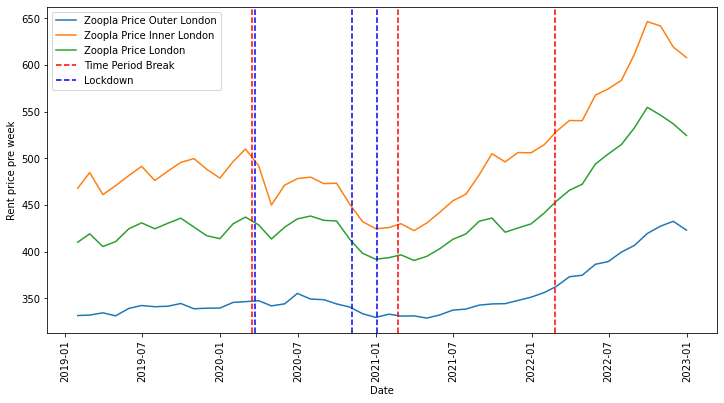

In [14]:
fig,ax=plt.subplots(figsize=(12,6))

ax.set_xlabel("Date")
ax.set_ylabel("Rent price pre week")
#ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price_outer['edate'], monthly_price_outer.price_last,label='Zoopla Price Outer London')
ax.plot(monthly_price_inner['edate'], monthly_price_inner.price_last,label='Zoopla Price Inner London')
ax.plot(monthly_price['edate'], monthly_price.price_last,label='Zoopla Price London')
# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2021-02-22'), pd.to_datetime('2022-02-24')]
vertical_line_dates2 = [ pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]
#pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')
    
plt.axvline(x=pd.to_datetime('2020-03-16'), color='red', linestyle='--',label='Time Period Break')
# Plot the blue vertical lines
for date in vertical_line_dates2:
    plt.axvline(x=date, color='blue', linestyle='--')
plt.axvline(x=pd.to_datetime('2020-03-23'), color='blue', linestyle='--',label='Lockdown')
# Display the plot
plt.legend()
plt.show()

In [ ]:
#Zoopla_reg=Zoopla_reg.drop(columns= ['Unnamed: 0.1','Unnamed: 0'])

In [114]:
#Zoopla_reg['covid_stage2'] = Zoopla_reg.apply( lambda row: row['pre']+2*row['during']+ 3*row['post'],axis=1)

### regression

In [115]:
Zoopla_reg_dummy= pd.get_dummies(Zoopla_reg,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [125]:
Zoopla_reg_dummy.to_csv('Zoopla_reg_dummy_0821.csv')

In [139]:
X2=Zoopla_reg_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','post',
                                 'pre','during','during1','during2','post1','post2',
                                 'LSOA11NM','LAD11NM','filter','covid_stage','duration_1','edate'])

In [75]:
X2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 699424 entries, 0 to 829510
Data columns (total 59 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   bluesp                             699424 non-null  int32
 1   greensp                            699424 non-null  int32
 2   station                            699424 non-null  int32
 3   school                             699424 non-null  int32
 4   shop                               699424 non-null  int32
 5   restaurant                         699424 non-null  int32
 6   inner_London                       699424 non-null  int64
 7   num_bed_last_0                     699424 non-null  uint8
 8   num_bed_last_1                     699424 non-null  uint8
 9   num_bed_last_2                     699424 non-null  uint8
 10  num_bed_last_3                     699424 non-null  uint8
 11  num_bed_last_4                     699424 non-null  uint8
 12  nu

In [140]:
X=Zoopla_reg.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LAD11CD','LSOA11CD','post',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','covid_stage','duration_1','edate','property_type'])

In [30]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699424 entries, 0 to 699423
Data columns (total 8 columns):
 #   Column        Non-Null Count   Dtype
---  ------        --------------   -----
 0   num_bed_last  699424 non-null  int64
 1   num_bath_max  699424 non-null  int64
 2   bluesp        699424 non-null  int64
 3   greensp       699424 non-null  int64
 4   station       699424 non-null  int64
 5   shop          699424 non-null  int64
 6   restaurant    699424 non-null  int64
 7   inner_London  699424 non-null  int64
dtypes: int64(8)
memory usage: 42.7 MB


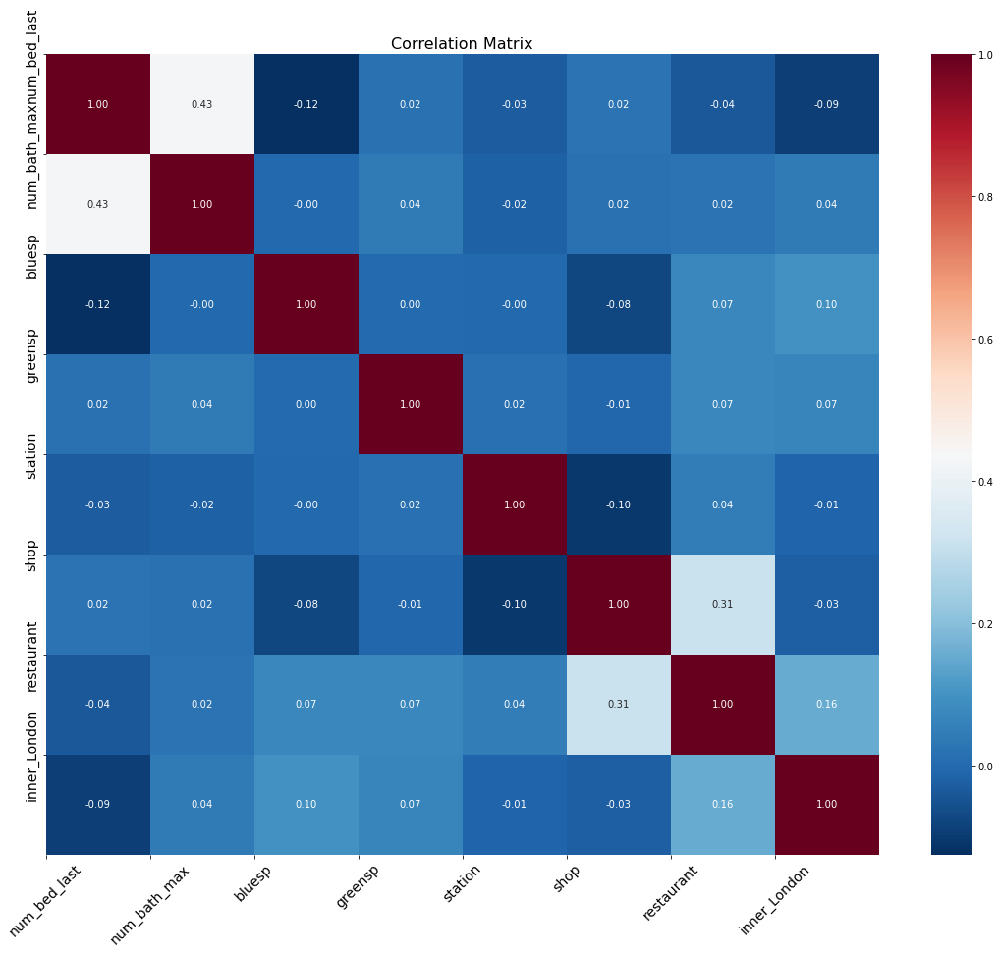

In [31]:
import seaborn as sns

# 假设你已经有了数据框 df
df = X

plt.rcParams["axes.grid"] = False
plt.figure(figsize=(19, 15))

# 计算相关性矩阵
corr_matrix = df.corr()

# 使用Seaborn绘制红蓝配色的相关性矩阵
sns.heatmap(corr_matrix, cmap='RdBu_r', annot=True, fmt=".2f")

plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14, rotation=45)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14)
plt.title('Correlation Matrix', fontsize=16)

plt.show()



In [33]:
# calculating VIF
# This function is adjusted from: https://stackoverflow.com/a/51329496/4667568
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from statsmodels.tools.tools import add_constant

def drop_column_using_vif_(df, thresh=5):
    '''
    Calculates VIF each feature in a pandas dataframe, and repeatedly drop the columns with the highest VIF
    A constant must be added to variance_inflation_factor or the results will be incorrect

    :param df: the pandas dataframe containing only the predictor features, not the response variable
    :param thresh: (default 5) the threshould VIF value. If the VIF of a variable is greater than thresh, it should be removed from the dataframe
    :return: dataframe with multicollinear features removed
    '''
    while True:
        # adding a constatnt item to the data. add_constant is a function from statsmodels (see the import above)
        df_with_const = add_constant(df)

        vif_df = pd.Series([variance_inflation_factor(df_with_const.values, i) 
               for i in range(df_with_const.shape[1])], name= "VIF",
              index=df_with_const.columns).to_frame()

        # drop the const
        vif_df = vif_df.drop('const')
        
        # if the largest VIF is above the thresh, remove a variable with the largest VIF
        # If there are multiple variabels with VIF>thresh, only one of them is removed. This is because we want to keep as many variables as possible
        if vif_df.VIF.max() > thresh:
            # If there are multiple variables with the maximum VIF, choose the first one
            index_to_drop = vif_df.index[vif_df.VIF == vif_df.VIF.max()].tolist()[0]
            print('Dropping: {}'.format(index_to_drop))
            df = df.drop(columns = index_to_drop)
        else:
            # No VIF is above threshold. Exit the loop
            break

    return df

In [34]:
# using VIF on the bike_rental dataset
df_predictors_selected_VIF = drop_column_using_vif_(X2)
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF.columns)

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: LAD11CD_E09000002


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: num_bath_max_4


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: num_bed_last_6


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: property_type_Detached house


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: inner_London
Dropping: num_bed_last_2
Dropping: num_bath_max_1
Dropping: property_type_Studio
Dropping: LAD11CD_E09000033
Dropping: property_type_Flat
The columns remaining after VIF selection are:
Index(['bluesp', 'greensp', 'station', 'shop', 'restaurant', 'num_bed_last_0',
       'num_bed_last_1', 'num_bed_last_3', 'num_bed_last_4', 'num_bed_last_5',
       'num_bath_max_0', 'num_bath_max_2', 'num_bath_max_3',
       'property_type_End terrace house', 'property_type_Maisonette',
       'property_type_Semi-detached house', 'property_type_Terraced house',
       'LAD11CD_E09000001', 'LAD11CD_E09000003', 'LAD11CD_E09000004',
       'LAD11CD_E09000005', 'LAD11CD_E09000006', 'LAD11CD_E09000007',
       'LAD11CD_E09000008', 'LAD11CD_E09000009', 'LAD11CD_E09000010',
       'LAD11CD_E09000011', 'LAD11CD_E09000012', 'LAD11CD_E09000013',
       'LAD11CD_E09000014', 'LAD11CD_E09000015', 'LAD11CD_E09000016',
       'LAD11CD_E09000017', 'LAD11CD_E09000018', 'LAD11CD_E09000019',
       

### mlr 

#### london

In [141]:
X2_drop_vif=X2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London'])
#,'inner_London','num_bed_last_2','num_bath_max_1','property_type_Studio','LAD11CD_E09000016','property_type_Flat','Unnamed: 0.1','Unnamed: 0','school'

In [142]:
X_mlr_london=X2_drop_vif.columns.tolist()
#X_mlr_london=X2_drop_vif.columns.tolist()

In [132]:
X_mlr_london

['bluesp',
 'greensp',
 'station',
 'shop',
 'restaurant',
 'inner_London',
 'num_bed_last_0',
 'num_bed_last_1',
 'num_bed_last_2',
 'num_bed_last_3',
 'num_bed_last_4',
 'num_bed_last_5',
 'num_bath_max_0',
 'num_bath_max_1',
 'num_bath_max_2',
 'num_bath_max_3',
 'property_type_Detached house',
 'property_type_Flat',
 'property_type_Maisonette',
 'property_type_Semi-detached house',
 'property_type_Studio',
 'property_type_Terraced house',
 'LAD11CD_E09000001',
 'LAD11CD_E09000002',
 'LAD11CD_E09000003',
 'LAD11CD_E09000004',
 'LAD11CD_E09000005',
 'LAD11CD_E09000006',
 'LAD11CD_E09000007',
 'LAD11CD_E09000008',
 'LAD11CD_E09000009',
 'LAD11CD_E09000010',
 'LAD11CD_E09000011',
 'LAD11CD_E09000012',
 'LAD11CD_E09000013',
 'LAD11CD_E09000014',
 'LAD11CD_E09000015',
 'LAD11CD_E09000016',
 'LAD11CD_E09000017',
 'LAD11CD_E09000018',
 'LAD11CD_E09000019',
 'LAD11CD_E09000020',
 'LAD11CD_E09000021',
 'LAD11CD_E09000022',
 'LAD11CD_E09000023',
 'LAD11CD_E09000024',
 'LAD11CD_E09000025',
 'L

In [43]:
Zoopla_reg_dummy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 699424 entries, 0 to 699423
Data columns (total 79 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   property_id                        699424 non-null  float64       
 1   start_date_new                     699424 non-null  object        
 2   price_last                         699424 non-null  int64         
 3   end_date_new                       699424 non-null  object        
 4   duration                           699424 non-null  object        
 5   duration_1                         699424 non-null  int64         
 6   lnprice                            699424 non-null  float64       
 7   post                               699424 non-null  int32         
 8   post2                              699424 non-null  int32         
 9   post1                              699424 non-null  int32         
 10  pre                 

In [143]:
models = []
names = []

for covid_stage in range(1, 5):
    stage = Zoopla_reg_dummy[Zoopla_reg_dummy['covid_stage'] == covid_stage]
    X = stage[X_mlr_london]  # Select the X variables from the DataFrame  
    y = stage['price_last']
    model = sm.OLS(y, X).fit()
    models.append(model)
    names.append(f'covid_stage {covid_stage}')

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)


                                  covid_stage 1 covid_stage 2 covid_stage 3 covid_stage 4
-----------------------------------------------------------------------------------------
bluesp                            -2.876***     -8.038***     10.146***     20.852***    
                                  (0.850)       (0.883)       (0.896)       (1.398)      
greensp                           10.957***     15.281***     16.096***     21.907***    
                                  (0.741)       (0.782)       (0.785)       (1.236)      
station                           -4.783***     -3.992***     -0.681        -3.663***    
                                  (0.747)       (0.795)       (0.789)       (1.245)      
school                            -15.319***    -3.450***     -3.291***     -8.687***    
                                  (1.057)       (1.208)       (1.165)       (1.776)      
shop                              -5.527***     -8.130***     -2.892***     -1.626       
         

#### inner london

In [144]:
Zoopla_reg_inner = Zoopla_reg[Zoopla_reg['inner_London']==1]

In [ ]:
Zoopla_reg_inner

In [145]:
Zoopla_reg_inner_dummy= pd.get_dummies(Zoopla_reg_inner,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [50]:
Zoopla_reg_inner_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 427761 entries, 0 to 699423
Data columns (total 60 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   property_id                        427761 non-null  float64       
 1   start_date_new                     427761 non-null  object        
 2   price_last                         427761 non-null  int64         
 3   end_date_new                       427761 non-null  object        
 4   duration                           427761 non-null  object        
 5   duration_1                         427761 non-null  int64         
 6   lnprice                            427761 non-null  float64       
 7   post                               427761 non-null  int32         
 8   post2                              427761 non-null  int32         
 9   post1                              427761 non-null  int32         
 10  pre                 

In [152]:
X_inner=Zoopla_reg_inner_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','post','duration_1',
                                 'pre','during','during1','during2','post1','post2', 'LSOA11NM','LAD11NM','filter','covid_stage','edate',
                                             'LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London'])
#

In [151]:
X_inner.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 427761 entries, 0 to 829510
Data columns (total 37 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   duration_1                         427761 non-null  int64         
 1   bluesp                             427761 non-null  int32         
 2   greensp                            427761 non-null  int32         
 3   station                            427761 non-null  int32         
 4   school                             427761 non-null  int32         
 5   shop                               427761 non-null  int32         
 6   restaurant                         427761 non-null  int32         
 7   edate                              427761 non-null  datetime64[ns]
 8   num_bed_last_0                     427761 non-null  uint8         
 9   num_bed_last_1                     427761 non-null  uint8         
 10  num_bed_last_2      

In [153]:
X_mlr_inner_london=X_inner.columns.tolist()

In [154]:
models = []
names = []

for covid_stage in range(1, 5):
    stage = Zoopla_reg_inner_dummy[Zoopla_reg_inner_dummy['covid_stage'] == covid_stage]
    X = stage[X_mlr_inner_london]  # Select the X variables from the DataFrame  
    y = stage['price_last']
    model = sm.OLS(y, X).fit()
    models.append(model)
    names.append(f'covid_stage {covid_stage}')

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)


                                  covid_stage 1 covid_stage 2 covid_stage 3 covid_stage 4
-----------------------------------------------------------------------------------------
bluesp                            -10.473***    -14.458***    9.662***      21.237***    
                                  (1.173)       (1.123)       (1.214)       (1.894)      
greensp                           4.105***      11.443***     13.519***     16.295***    
                                  (1.065)       (1.034)       (1.096)       (1.737)      
station                           -11.583***    -9.801***     -3.203***     -9.714***    
                                  (1.094)       (1.065)       (1.129)       (1.789)      
school                            -18.361***    1.813         2.913         1.795        
                                  (1.992)       (2.015)       (2.138)       (3.316)      
shop                              -11.850***    -12.967***    -6.240***     -5.618***    
         

#### outer london

In [157]:
Zoopla_reg_outer = Zoopla_reg[Zoopla_reg['inner_London']==0]

In [158]:
Zoopla_reg_outer_dummy= pd.get_dummies(Zoopla_reg_outer,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [160]:
Zoopla_reg_outer_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 271663 entries, 4 to 829508
Data columns (total 64 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   property_id                        271663 non-null  int64         
 1   start_date_new                     271663 non-null  object        
 2   price_last                         271663 non-null  int64         
 3   end_date_new                       271663 non-null  object        
 4   duration_1                         271663 non-null  int64         
 5   lnprice                            271663 non-null  float64       
 6   during1                            271663 non-null  int64         
 7   during2                            271663 non-null  int64         
 8   post                               271663 non-null  int64         
 9   post2                              271663 non-null  int64         
 10  post1               

In [161]:
X_outer=Zoopla_reg_outer_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','post','duration_1',
                                 'pre','during','during1','during2','post1','post2', 'LSOA11NM','LAD11NM','filter','covid_stage','edate',
                                             'LAD11CD_E09000031','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London'])
#

In [163]:
X_mlr_outer_london=X_outer.columns.tolist()

In [165]:
models = []
names = []

for covid_stage in range(1, 5):
    stage = Zoopla_reg_outer_dummy[Zoopla_reg_outer_dummy['covid_stage'] == covid_stage]
    X = stage[X_mlr_outer_london]  # Select the X variables from the DataFrame  
    y = stage['price_last']
    model = sm.OLS(y, X).fit()
    models.append(model)
    names.append(f'covid_stage {covid_stage}')

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)



                                  covid_stage 1 covid_stage 2 covid_stage 3 covid_stage 4
-----------------------------------------------------------------------------------------
bluesp                            12.148***     9.311***      10.581***     15.382***    
                                  (0.982)       (1.181)       (1.041)       (1.677)      
greensp                           17.986***     18.914***     18.002***     27.406***    
                                  (0.792)       (0.948)       (0.860)       (1.390)      
station                           4.401***      5.701***      2.054**       2.596*       
                                  (0.776)       (0.934)       (0.828)       (1.349)      
school                            -6.577***     -2.844***     -2.429**      -5.818***    
                                  (0.876)       (1.085)       (0.957)       (1.532)      
shop                              -1.274*       -2.341***     -2.018**      -1.990       
         

### discontinuous regression

In [166]:
Zoopla_reg.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 699424 entries, 0 to 829510
Data columns (total 30 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   property_id     699424 non-null  int64         
 1   start_date_new  699424 non-null  object        
 2   price_last      699424 non-null  int64         
 3   property_type   699424 non-null  object        
 4   num_bed_last    699424 non-null  int64         
 5   num_bath_max    699424 non-null  int64         
 6   end_date_new    699424 non-null  object        
 7   duration_1      699424 non-null  int64         
 8   lnprice         699424 non-null  float64       
 9   during1         699424 non-null  int64         
 10  during2         699424 non-null  int64         
 11  post            699424 non-null  int64         
 12  post2           699424 non-null  int64         
 13  post1           699424 non-null  int64         
 14  pre             699424 non-null  int

In [5]:
Zoopla_reg=Zoopla_reg.drop(columns= ['Unnamed: 0'])

In [6]:
pre = Zoopla_reg[Zoopla_reg['pre']==1]
during = Zoopla_reg[Zoopla_reg['during']==1]
#during1 = Zoopla_reg[Zoopla_reg['during1']==1]
#during2 = Zoopla_reg[Zoopla_reg['during2']==1]
post = Zoopla_reg[Zoopla_reg['post']==1]
post1 =  Zoopla_reg[Zoopla_reg['post1']==1]
post2 = Zoopla_reg[Zoopla_reg['post2']==1]


In [184]:
Zoopla_reg_dummy['edate']=pd.to_datetime(Zoopla_reg_dummy['end_date_new'],format='%Y-%m-%d',errors='coerce')
date1=pd.to_datetime('2020-01-16')
date2=pd.to_datetime('2020-05-16')
pre_during =Zoopla_reg_dummy[(Zoopla_reg_dummy['edate']>=date1)&(Zoopla_reg_dummy['edate']<=date2)]
pre_during.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 44667 entries, 19 to 825795
Data columns (total 78 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   property_id                        44667 non-null  int64         
 1   start_date_new                     44667 non-null  object        
 2   price_last                         44667 non-null  int64         
 3   end_date_new                       44667 non-null  object        
 4   duration_1                         44667 non-null  int64         
 5   lnprice                            44667 non-null  float64       
 6   during1                            44667 non-null  int64         
 7   during2                            44667 non-null  int64         
 8   post                               44667 non-null  int64         
 9   post2                              44667 non-null  int64         
 10  post1                           

In [169]:
date3=pd.to_datetime('2020-03-16')
pre_during['date']=date3-pre_during['edate']

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\2798537036.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_during['date']=date3-pre_during['edate']


In [170]:
pre_during['weeks']=(date3 - pre_during['edate']).dt.days // 7

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\1809690611.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_during['weeks']=(date3 - pre_during['edate']).dt.days // 7


In [171]:
pre_during.head()

,property_id,start_date_new,price_last,end_date_new,duration_1,lnprice,during1,during2,post,post2,...,LAD11CD_E09000026,LAD11CD_E09000027,LAD11CD_E09000028,LAD11CD_E09000029,LAD11CD_E09000030,LAD11CD_E09000031,LAD11CD_E09000032,LAD11CD_E09000033,date,weeks
19,724366,2020-03-13,575,2020-04-21,39,6.354370,1,0,0,0,...,0,0,0,0,0,0,0,1,-36 days,-6
20,724366,2020-04-10,575,2020-04-14,4,6.354370,1,0,0,0,...,0,0,0,0,0,0,0,1,-29 days,-5
23,748305,2020-02-20,575,2020-03-17,26,6.354370,1,0,0,0,...,0,0,0,0,0,0,0,1,-1 days,-1
40,2465752,2020-04-08,277,2020-04-16,8,5.624018,1,0,0,0,...,0,0,0,0,0,0,0,0,-31 days,-5
67,2465859,2020-04-04,138,2020-05-06,32,4.927254,1,0,0,0,...,0,0,0,0,0,0,0,0,-51 days,-8


In [185]:
interact_col = ['bluesp','greensp','inner_London','school','station','shop','restaurant']

for col in interact_col:
    pre_during[f'{col}_1'] = pre_during['during'] *pre_during[col]

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3650840597.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_during[f'{col}_1'] = pre_during['during'] *pre_during[col]
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3650840597.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_during[f'{col}_1'] = pre_during['during'] *pre_during[col]
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3650840597.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

In [173]:
pre_during= pd.get_dummies(pre_during,columns=['weeks'])

In [186]:
X_pre_during=pre_during.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','school','covid_stage','edate',
                                 'pre','post','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1'])#'covid_stage','covid_stage2','date','date1','edate'

In [176]:
X_pre_during.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44667 entries, 19 to 825795
Data columns (total 84 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   during                             44667 non-null  int64
 1   bluesp                             44667 non-null  int32
 2   greensp                            44667 non-null  int32
 3   station                            44667 non-null  int32
 4   shop                               44667 non-null  int32
 5   restaurant                         44667 non-null  int32
 6   inner_London                       44667 non-null  int64
 7   num_bed_last_0                     44667 non-null  uint8
 8   num_bed_last_1                     44667 non-null  uint8
 9   num_bed_last_2                     44667 non-null  uint8
 10  num_bed_last_3                     44667 non-null  uint8
 11  num_bed_last_4                     44667 non-null  uint8
 12  num_bed_last_5  

In [76]:
# using VIF on the bike_rental dataset
df_predictors_selected_VIF_pre_during = drop_column_using_vif_(X_pre_during)
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF_pre_during.columns)

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: inner_London


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bed_last_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bath_max_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: property_type_Detached house


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: LAD11CD_E09000001
Dropping: num_bed_last_2
Dropping: LAD11CD_E09000033
Dropping: property_type_Flat
Dropping: during
The columns remaining after VIF selection are:
Index(['bluesp', 'greensp', 'station', 'shop', 'restaurant', 'num_bed_last_1',
       'num_bed_last_3', 'num_bed_last_4', 'num_bed_last_5', 'num_bed_last_6',
       'num_bath_max_1', 'num_bath_max_2', 'num_bath_max_3', 'num_bath_max_4',
       'property_type_End terrace house', 'property_type_Maisonette',
       'property_type_Semi-detached house', 'property_type_Studio',
       'property_type_Terraced house', 'LAD11CD_E09000002',
       'LAD11CD_E09000003', 'LAD11CD_E09000004', 'LAD11CD_E09000005',
       'LAD11CD_E09000006', 'LAD11CD_E09000007', 'LAD11CD_E09000008',
       'LAD11CD_E09000009', 'LAD11CD_E09000010', 'LAD11CD_E09000011',
       'LAD11CD_E09000012', 'LAD11CD_E09000013', 'LAD11CD_E09000014',
       'LAD11CD_E09000015', 'LAD11CD_E09000016', 'LAD11CD_E09000017',
       'LAD11CD_E09000018', 'LAD11CD_E090

In [187]:
X_pre_during2=X_pre_during.drop(columns=['num_bed_last_6','num_bath_max_4','property_type_End terrace house','LAD11CD_E09000033','inner_London'])
#'num_bed_last_0','num_bath_max_0','LAD11CD_E09000001','property_type_Detached house','num_bed_last_2','LAD11CD_E09000033','property_type_Flat','weeks_-9'

In [188]:
X_pre_during2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44667 entries, 19 to 825795
Data columns (total 61 columns):
 #   Column                             Non-Null Count  Dtype
---  ------                             --------------  -----
 0   during                             44667 non-null  int64
 1   bluesp                             44667 non-null  int32
 2   greensp                            44667 non-null  int32
 3   station                            44667 non-null  int32
 4   shop                               44667 non-null  int32
 5   restaurant                         44667 non-null  int32
 6   num_bed_last_0                     44667 non-null  uint8
 7   num_bed_last_1                     44667 non-null  uint8
 8   num_bed_last_2                     44667 non-null  uint8
 9   num_bed_last_3                     44667 non-null  uint8
 10  num_bed_last_4                     44667 non-null  uint8
 11  num_bed_last_5                     44667 non-null  uint8
 12  num_bath_max_0  

In [189]:
model_pre_during = sm.OLS(pre_during['price_last'],X_pre_during2).fit()
print(model_pre_during.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.899
Model:                            OLS   Adj. R-squared (uncentered):              0.898
Method:                 Least Squares   F-statistic:                              6481.
Date:                Tue, 22 Aug 2023   Prob (F-statistic):                        0.00
Time:                        14:00:06   Log-Likelihood:                     -2.8881e+05
No. Observations:               44667   AIC:                                  5.778e+05
Df Residuals:                   44606   BIC:                                  5.783e+05
Df Model:                          61                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

In [190]:
Zoopla_reg_dummy['edate']=pd.to_datetime(Zoopla_reg_dummy['end_date_new'],format='%Y-%m-%d',errors='coerce')

date1=pd.to_datetime('2020-12-22')
date2=pd.to_datetime('2021-02-22')
date3=pd.to_datetime('2021-04-22')
during_post =Zoopla_reg_dummy[((Zoopla_reg_dummy['edate']>=date1)&(Zoopla_reg_dummy['edate']<=date2))|((Zoopla_reg_dummy['edate']>=date2)&(Zoopla_reg_dummy['edate']<=date3))]
during_post.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 73682 entries, 1 to 828386
Data columns (total 78 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   property_id                        73682 non-null  int64         
 1   start_date_new                     73682 non-null  object        
 2   price_last                         73682 non-null  int64         
 3   end_date_new                       73682 non-null  object        
 4   duration_1                         73682 non-null  int64         
 5   lnprice                            73682 non-null  float64       
 6   during1                            73682 non-null  int64         
 7   during2                            73682 non-null  int64         
 8   post                               73682 non-null  int64         
 9   post2                              73682 non-null  int64         
 10  post1                            

In [191]:
interact_col = ['bluesp','greensp','inner_London','station','shop','restaurant']

for col in interact_col:
    during_post[f'{col}_1'] =during_post['post'] *during_post[col]

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3857493181.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  during_post[f'{col}_1'] =during_post['post'] *during_post[col]
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3857493181.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  during_post[f'{col}_1'] =during_post['post'] *during_post[col]
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_15256\3857493181.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFr

In [192]:
X_during_post=during_post.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','school','covid_stage',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

In [193]:
X_during_post2=X_during_post.drop(columns=['num_bed_last_6','num_bath_max_4','property_type_End terrace house','LAD11CD_E09000033','inner_London'])

In [194]:
model_during_post = sm.OLS(during_post['price_last'],X_during_post2).fit()
print(model_during_post.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.909
Model:                            OLS   Adj. R-squared (uncentered):              0.909
Method:                 Least Squares   F-statistic:                          1.227e+04
Date:                Tue, 22 Aug 2023   Prob (F-statistic):                        0.00
Time:                        14:01:13   Log-Likelihood:                     -4.6405e+05
No. Observations:               73682   AIC:                                  9.282e+05
Df Residuals:                   73622   BIC:                                  9.288e+05
Df Model:                          60                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

In [42]:
Zoopla_reg_dummy['edate']=pd.to_datetime(Zoopla_reg_dummy['end_date_new'],format='%Y-%m-%d',errors='coerce')
date1=pd.to_datetime('2020-02-01')
date2=pd.to_datetime('2020-03-11')
date3=pd.to_datetime('2021-02-22')
date4=pd.to_datetime('2021-04-22')
pre_post =Zoopla_reg_dummy[((Zoopla_reg_dummy['edate']>=date1)&(Zoopla_reg_dummy['edate']<=date2))|((Zoopla_reg_dummy['edate']>=date3)&(Zoopla_reg_dummy['edate']<=date4))]
pre_post.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55720 entries, 25 to 698439
Data columns (total 79 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   property_id                        55720 non-null  float64       
 1   start_date_new                     55720 non-null  object        
 2   price_last                         55720 non-null  int64         
 3   end_date_new                       55720 non-null  object        
 4   duration                           55720 non-null  object        
 5   duration_1                         55720 non-null  int64         
 6   lnprice                            55720 non-null  float64       
 7   post                               55720 non-null  int32         
 8   post2                              55720 non-null  int32         
 9   post1                              55720 non-null  int32         
 10  pre                             

In [100]:
interact_col = ['bluesp','greensp','inner_London','station','shop','restaurant']

for col in interact_col:
    pre_post[f'{col}_1'] = pre_post['post'] *pre_post[col]

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_2676\239107561.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_post[f'{col}_1'] = pre_post['post'] *pre_post[col]
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_2676\239107561.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_post[f'{col}_1'] = pre_post['post'] *pre_post[col]
C:\Users\ucfnina\AppData\Local\Temp\ipykernel_2676\239107561.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[ro

In [101]:
X_pre_post=pre_post.drop(columns=['property_id','start_date_new','price_last','end_date_new','duration','lnprice','LSOA11CD','school','covid_stage',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

In [84]:
# using VIF on the bike_rental dataset
df_predictors_selected_VIF_during_post = drop_column_using_vif_(X_pre_post)
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF_during_post.columns)

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: inner_London


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bed_last_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bath_max_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: property_type_Detached house


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: LAD11CD_E09000001
Dropping: num_bed_last_2
Dropping: property_type_Flat
Dropping: LAD11CD_E09000033
Dropping: post
The columns remaining after VIF selection are:
Index(['bluesp', 'greensp', 'station', 'shop', 'restaurant', 'num_bed_last_1',
       'num_bed_last_3', 'num_bed_last_4', 'num_bed_last_5', 'num_bed_last_6',
       'num_bath_max_1', 'num_bath_max_2', 'num_bath_max_3', 'num_bath_max_4',
       'property_type_End terrace house', 'property_type_Maisonette',
       'property_type_Semi-detached house', 'property_type_Studio',
       'property_type_Terraced house', 'LAD11CD_E09000002',
       'LAD11CD_E09000003', 'LAD11CD_E09000004', 'LAD11CD_E09000005',
       'LAD11CD_E09000006', 'LAD11CD_E09000007', 'LAD11CD_E09000008',
       'LAD11CD_E09000009', 'LAD11CD_E09000010', 'LAD11CD_E09000011',
       'LAD11CD_E09000012', 'LAD11CD_E09000013', 'LAD11CD_E09000014',
       'LAD11CD_E09000015', 'LAD11CD_E09000016', 'LAD11CD_E09000017',
       'LAD11CD_E09000018', 'LAD11CD_E09000

In [110]:
X_pre_post2=X_pre_post.drop(columns=['num_bed_last_0','num_bath_max_0','LAD11CD_E09000001','property_type_Detached house','num_bed_last_2','LAD11CD_E09000033','property_type_Flat'])

In [111]:
model_pre_post = sm.OLS(pre_post['price_last'],X_pre_post2).fit()
print(model_pre_post.summary())

                            OLS Regression Results                            
Dep. Variable:             price_last   R-squared:                       0.583
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     1365.
Date:                Sun, 20 Aug 2023   Prob (F-statistic):               0.00
Time:                        21:53:26   Log-Likelihood:            -3.5086e+05
No. Observations:               55720   AIC:                         7.018e+05
Df Residuals:                   55662   BIC:                         7.024e+05
Df Model:                          57                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
post  

In [31]:
during_post = pd.concat([during,post1])

In [32]:
interact_col = ['bluesp','greensp','inner_London','station','school','shop','restaurant']

for col in interact_col:
    during_post[f'{col}_1'] = during_post['post'] *during_post[col]

In [33]:
during_post_dummy= pd.get_dummies(during_post,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [34]:
X_during_post=during_post.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','property_type','LAD11CD',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','covid_stage','duration_1','edate',])

In [35]:
X_during_post2=during_post_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

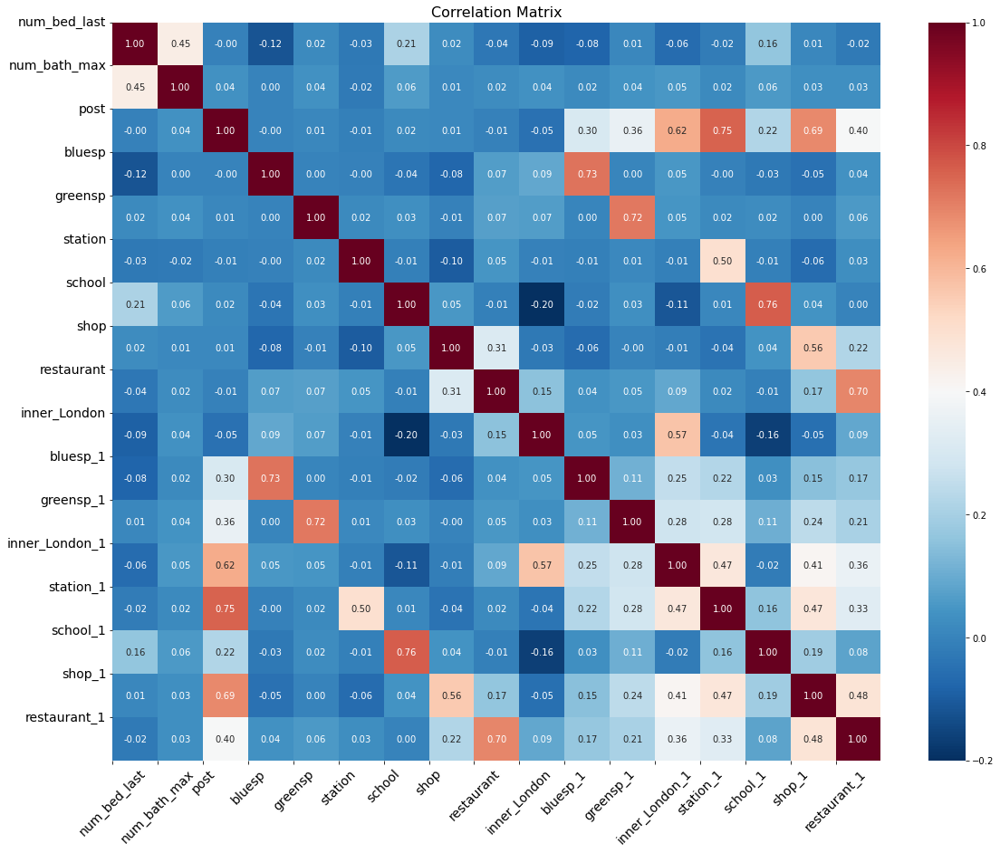

In [120]:
import seaborn as sns

# 假设你已经有了数据框 df
df =X_during_post

plt.rcParams["axes.grid"] = False
plt.figure(figsize=(19, 15))

# 计算相关性矩阵
corr_matrix = df.corr()

# 使用Seaborn绘制红蓝配色的相关性矩阵
sns.heatmap(corr_matrix, cmap='RdBu_r', annot=True, fmt=".2f")

plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14, rotation=45)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14)
plt.title('Correlation Matrix', fontsize=16)

plt.show()

In [121]:
# using VIF on the bike_rental dataset
df_predictors_selected_VIF_during_post = drop_column_using_vif_(X_during_post2)
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF_during_post.columns)

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: num_bed_last_6


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: LAD11CD_E09000016


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: property_type_Semi-detached house


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bath_max_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: inner_London
Dropping: num_bed_last_2
Dropping: LAD11CD_E09000033
Dropping: property_type_Studio
Dropping: post
Dropping: property_type_Flat
The columns remaining after VIF selection are:
Index(['bluesp', 'greensp', 'station', 'school', 'shop', 'restaurant',
       'bluesp_1', 'greensp_1', 'inner_London_1', 'station_1', 'school_1',
       'shop_1', 'restaurant_1', 'num_bed_last_0', 'num_bed_last_1',
       'num_bed_last_3', 'num_bed_last_4', 'num_bed_last_5', 'num_bath_max_1',
       'num_bath_max_2', 'num_bath_max_3', 'num_bath_max_4',
       'property_type_Detached house', 'property_type_End terrace house',
       'property_type_Maisonette', 'property_type_Terraced house',
       'LAD11CD_E09000001', 'LAD11CD_E09000002', 'LAD11CD_E09000003',
       'LAD11CD_E09000004', 'LAD11CD_E09000005', 'LAD11CD_E09000006',
       'LAD11CD_E09000007', 'LAD11CD_E09000008', 'LAD11CD_E09000009',
       'LAD11CD_E09000010', 'LAD11CD_E09000011', 'LAD11CD_E09000012',
       'LAD11CD_E09000013'

In [205]:
X_during_post2_1=X_during_post2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage'])
#'inner_London','restaurant_1','shop_1','school_1','station_1'

In [206]:
model_during_post2 = sm.OLS(during_post_dummy['price_last'],X_during_post2_1).fit()
print(model_during_post2.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.903
Model:                            OLS   Adj. R-squared (uncentered):              0.903
Method:                 Least Squares   F-statistic:                          7.214e+04
Date:                Tue, 22 Aug 2023   Prob (F-statistic):                        0.00
Time:                        14:03:27   Log-Likelihood:                     -3.0987e+06
No. Observations:              480313   AIC:                                  6.197e+06
Df Residuals:                  480251   BIC:                                  6.198e+06
Df Model:                          62                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

In [210]:
during_post_inner =during_post[during_post['inner_London' ]==1]

In [211]:
during_post_dummy_inner= pd.get_dummies(during_post_inner,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [216]:
X_during_post_dummy_inner=during_post_dummy_inner.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1','edate', 'LAD11CD_E09000033','property_type_End terrace house',
                                                                'num_bath_max_4','num_bed_last_6','inner_London','inner_London_1','covid_stage'])#,'inner_London','restaurant_1','shop_1','school_1','inner_London_1','station_1'
#'num_bed_last_6','LAD11CD_E09000016','property_type_Semi-detached house','num_bath_max_0','num_bed_last_2','property_type_Flat','property_type_Studio',

In [217]:
model_during_post_inner = sm.OLS(during_post_dummy_inner['price_last'],X_during_post_dummy_inner).fit()
print(model_during_post_inner.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.901
Model:                            OLS   Adj. R-squared (uncentered):              0.901
Method:                 Least Squares   F-statistic:                          6.562e+04
Date:                Tue, 22 Aug 2023   Prob (F-statistic):                        0.00
Time:                        14:06:17   Log-Likelihood:                     -1.9765e+06
No. Observations:              301245   AIC:                                  3.953e+06
Df Residuals:                  301203   BIC:                                  3.953e+06
Df Model:                          42                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

In [218]:
during_post_outer =during_post[during_post['inner_London' ]==0]

In [219]:
during_post_dummy_outer= pd.get_dummies(during_post_outer,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [220]:
X_during_post_dummy_outer=during_post_dummy_outer.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1','edate', 'LAD11CD_E09000031','property_type_End terrace house',
                                                                'num_bath_max_4','num_bed_last_6','inner_London','inner_London_1','covid_stage'])#,'inner_London','restaurant_1','shop_1','school_1','inner_London_1','station_1'

In [221]:
model_during_post_outer = sm.OLS(during_post_dummy_outer['price_last'],X_during_post_dummy_outer).fit()
print(model_during_post_outer.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.932
Model:                            OLS   Adj. R-squared (uncentered):              0.932
Method:                 Least Squares   F-statistic:                          5.186e+04
Date:                Tue, 22 Aug 2023   Prob (F-statistic):                        0.00
Time:                        14:07:23   Log-Likelihood:                     -1.0813e+06
No. Observations:              179068   AIC:                                  2.163e+06
Df Residuals:                  179021   BIC:                                  2.163e+06
Df Model:                          47                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

In [123]:
during_post1 = pd.concat([during,post1])

In [62]:
during2_post1 = pd.concat([during2,post1])

In [63]:
interact_col = ['bluesp','greensp','inner_London','station','school','shop','restaurant']

for col in interact_col:
    during2_post1[f'{col}_1'] = during2_post1['post1'] *during2_post1[col]

In [64]:
during2_post1_dummy= pd.get_dummies(during2_post1,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [90]:
X_during2_post1=during2_post1.drop(columns=['property_id','start_date_new','price_last','end_date_new','duration','lnprice','LSOA11CD','property_type','LAD11CD',
                                 'pre','during','during1','during2','post','post2','LSOA11NM','LAD11NM','filter','covid_stage','covid_stage2','duration_1','edate',])

In [66]:
X_during2_post12=during2_post1_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','duration','lnprice','LSOA11CD',
                                 'pre','during','during1','during2','post','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

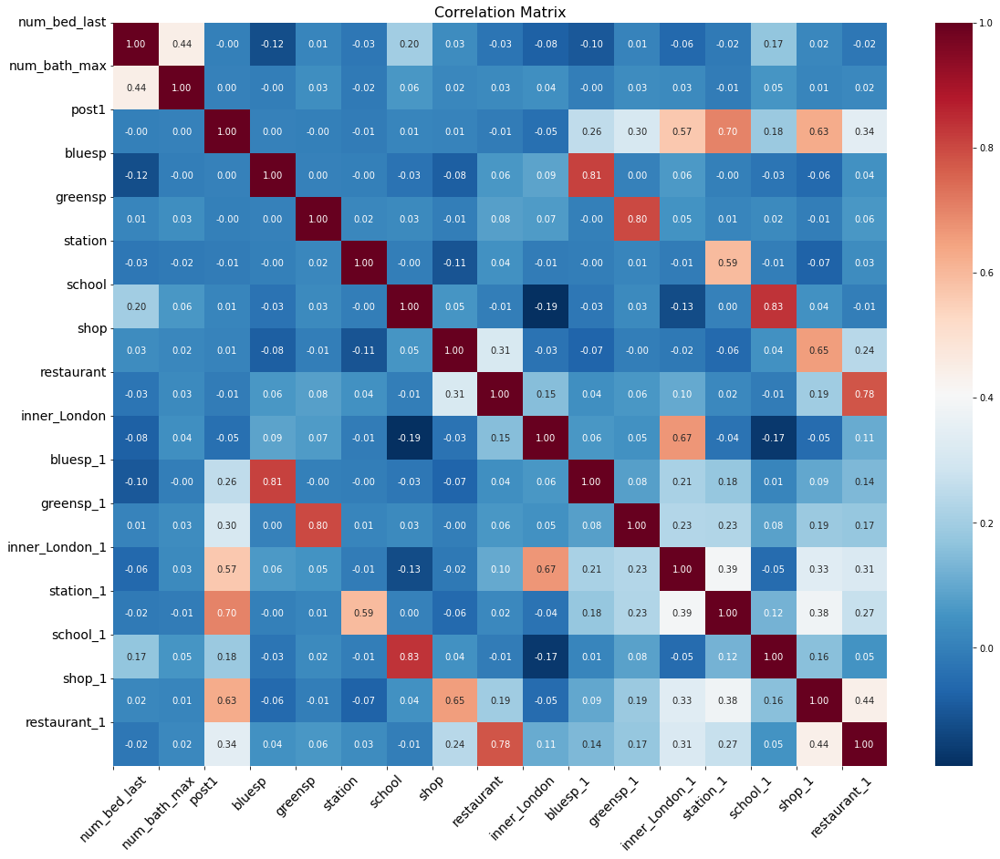

In [92]:
import seaborn as sns

# 假设你已经有了数据框 df
df =X_during2_post1

plt.rcParams["axes.grid"] = False
plt.figure(figsize=(19, 15))

# 计算相关性矩阵
corr_matrix = df.corr()

# 使用Seaborn绘制红蓝配色的相关性矩阵
sns.heatmap(corr_matrix, cmap='RdBu_r', annot=True, fmt=".2f")

plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14, rotation=45)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14)
plt.title('Correlation Matrix', fontsize=16)

plt.show()

In [93]:
# using VIF on the bike_rental dataset
df_predictors_selected_VIF_during2_post1 = drop_column_using_vif_(X_during2_post12)
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF_during2_post1.columns)

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: LAD11CD_E09000004


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: num_bath_max_4


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss


Dropping: num_bed_last_6


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: property_type_Detached house


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: inner_London
Dropping: num_bed_last_2
Dropping: num_bath_max_1
Dropping: property_type_Flat
Dropping: LAD11CD_E09000033
Dropping: num_bed_last_0
Dropping: post1
The columns remaining after VIF selection are:
Index(['bluesp', 'greensp', 'station', 'school', 'shop', 'restaurant',
       'bluesp_1', 'greensp_1', 'inner_London_1', 'station_1', 'school_1',
       'shop_1', 'restaurant_1', 'num_bed_last_1', 'num_bed_last_3',
       'num_bed_last_4', 'num_bed_last_5', 'num_bath_max_0', 'num_bath_max_2',
       'num_bath_max_3', 'property_type_End terrace house',
       'property_type_Maisonette', 'property_type_Semi-detached house',
       'property_type_Studio', 'property_type_Terraced house',
       'LAD11CD_E09000001', 'LAD11CD_E09000002', 'LAD11CD_E09000003',
       'LAD11CD_E09000005', 'LAD11CD_E09000006', 'LAD11CD_E09000007',
       'LAD11CD_E09000008', 'LAD11CD_E09000009', 'LAD11CD_E09000010',
       'LAD11CD_E09000011', 'LAD11CD_E09000012', 'LAD11CD_E09000013',
       'LAD11

In [68]:
X_during2_post12_1=X_during2_post12.drop(columns=['LAD11CD_E09000004','num_bath_max_4','num_bed_last_6','property_type_Detached house','num_bed_last_2',
                                           'num_bath_max_1','property_type_Flat','property_type_Flat','LAD11CD_E09000033','num_bed_last_0',])#'inner_London','restaurant_1','shop_1','school_1','station_1'

In [69]:
model_during2_post1 = sm.OLS(during2_post1_dummy['price_last'],X_during2_post12_1 ).fit()
print(model_during2_post1.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.911
Model:                            OLS   Adj. R-squared (uncentered):              0.911
Method:                 Least Squares   F-statistic:                          4.657e+04
Date:                Sun, 20 Aug 2023   Prob (F-statistic):                        0.00
Time:                        18:34:03   Log-Likelihood:                     -1.7330e+06
No. Observations:              273133   AIC:                                  3.466e+06
Df Residuals:                  273073   BIC:                                  3.467e+06
Df Model:                          60                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

In [29]:
during2_post1_dummy_outer =during2_post1_dummy[during2_post1_dummy['inner_London' ]==0]

In [32]:
X_during2_post1_dummy_outer=during2_post1_dummy_outer.drop(columns=['property_id','start_date_new','price_last','end_date_new','duration','lnprice','LSOA11CD',
                                 'pre','during','during1','during2','post1','post2','LSOA11NM','LAD11NM','filter','duration_1','edate','LAD11CD_E09000004','num_bath_max_4','num_bed_last_6','property_type_Detached house','num_bed_last_2',
                                           'num_bath_max_1','property_type_Flat','property_type_Flat','LAD11CD_E09000033','num_bed_last_0','inner_London',
                                                  'restaurant_1','shop_1','school_1','station_1'])#

In [34]:
model_during2_post1_outer = sm.OLS(during2_post1_dummy_outer['price_last'],X_during2_post1_dummy_outer).fit()
print(model_during2_post1_outer.summary())

                                 OLS Regression Results                                
Dep. Variable:             price_last   R-squared (uncentered):                   0.932
Model:                            OLS   Adj. R-squared (uncentered):              0.932
Method:                 Least Squares   F-statistic:                          3.578e+04
Date:                Sat, 19 Aug 2023   Prob (F-statistic):                        0.00
Time:                        21:00:59   Log-Likelihood:                     -6.1207e+05
No. Observations:              102269   AIC:                                  1.224e+06
Df Residuals:                  102230   BIC:                                  1.225e+06
Df Model:                          39                                                  
Covariance Type:            nonrobust                                                  
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------

#### London

In [36]:
pre_during = pd.concat([pre,during])
during_post1 = pd.concat([during,post1])
post1_post2 = pd.concat([post1,post2])

In [37]:
interact_col = ['bluesp','greensp','inner_London','station','school','shop','restaurant']

for col in interact_col:
    pre_during[f'{col}_1'] = pre_during['during'] *pre_during[col]
    during_post1[f'{col}_1'] = during_post1['post'] *during_post1[col]
    post1_post2[f'{col}_1'] =post1_post2['post2'] *post1_post2[col]

In [38]:
pre_during_dummy= pd.get_dummies(pre_during,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
during_post1_dummy= pd.get_dummies(during_post1,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
post1_post2_dummy= pd.get_dummies(post1_post2,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])


In [19]:
X_pre_during=pre_during.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD','property_type','LAD11CD',
                                 'pre','post1','during1','during2','post','post2','LSOA11NM','LAD11NM','filter','covid_stage','duration_1','edate'])

In [51]:
X_pre_during2=pre_during_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','post1','during1','during2','post','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',
X_during_post1=during_post1_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','post1','during1','during2','during','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',
X_post1_post2=post1_post2_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','lnprice','LSOA11CD',
                                 'pre','during','during1','during2','post','post1','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

In [62]:
X_pre_during2_1=X_pre_during2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'
                                            ])
                                            #'restaurant_1','shop_1','school_1','station_1''LAD11CD_E09000002','LAD11CD_E09000001','num_bath_max_4','property_type_End terrace house','num_bed_last_0','inner_London',
                                          # 'num_bath_max_1','property_type_Flat','LAD11CD_E09000033','num_bed_last_2',
X_during_post1_1=X_during_post1.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_post1_post2_1=X_post1_post2.drop(columns=['LAD11CD_E09000033','property_type_End terrace house','num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])                                          

In [63]:
model_pre_during = sm.OLS(pre_during_dummy['price_last'],X_pre_during2_1).fit()
model_during_post1 = sm.OLS(during_post1_dummy['price_last'],X_during_post1_1).fit()
model_post1_post2 = sm.OLS(post1_post2_dummy['price_last'],X_post1_post2_1).fit()

#### outer & inner

In [11]:
pre_during_outer =pre_during[pre_during['inner_London' ]==0]
pre_during_inner =pre_during[pre_during['inner_London' ]==1]

In [43]:
during_post1_outer =during_post1[during_post1['inner_London' ]==0]
during_post1_inner =during_post1[during_post1['inner_London' ]==1]

In [45]:
post1_post2_outer =post1_post2[post1_post2['inner_London' ]==0]
post1_post2_inner =post1_post2[post1_post2['inner_London' ]==1]

In [46]:
pre_during_outer_dummy= pd.get_dummies(pre_during_outer ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
during_post1_outer_dummy= pd.get_dummies(during_post1_outer ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
post1_post2_outer_dummy= pd.get_dummies(post1_post2_outer ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])


In [47]:
pre_during_inner_dummy= pd.get_dummies(pre_during_inner ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
during_post1_inner_dummy= pd.get_dummies(during_post1_inner ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])
post1_post2_inner_dummy= pd.get_dummies(post1_post2_inner ,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [14]:
X_pre_during_dummy_outer=pre_during_outer_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post1','during1',
                                                              'during2','post','post2','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000031','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_pre_during_dummy_inner=pre_during_inner_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post1','during1',
                                                              'during2','post','post2','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000033','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])

In [49]:
X_during_post1_outer_dummy=during_post1_outer_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','during1','post'
                                                              'during2','during','post2','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000031','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_during_post1_inner_dummy=during_post1_inner_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','during1','post'
                                                              'during2','during','post2','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000033','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])

In [68]:
X_post1_post2_outer_dummy=post1_post2_outer_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','during1','post'
                                                              'during2','during','post1','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000031','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])
X_post1_post2_inner_dummy=post1_post2_inner_dummy.drop(columns=['property_id','start_date_new','price_last',
                                                              'end_date_new','lnprice','LSOA11CD','pre','post','during1',
                                                              'during2','during','post1','LSOA11NM','LAD11NM','filter','duration_1','edate',
                                                             'LAD11CD_E09000033','property_type_End terrace house',
                                                              'num_bath_max_4','num_bed_last_6','inner_London','covid_stage','inner_London_1'])

In [50]:
model_pre_during_outer = sm.OLS(pre_during_outer_dummy['price_last'],X_pre_during_dummy_outer).fit()
model_pre_during_inner = sm.OLS(pre_during_inner_dummy['price_last'],X_pre_during_dummy_inner).fit()

In [58]:
model_during_post1_outer = sm.OLS(during_post1_outer_dummy['price_last'],X_during_post1_outer_dummy).fit()
model_during_post1_inner = sm.OLS(during_post1_inner_dummy['price_last'],X_during_post1_inner_dummy).fit()

In [69]:
model_post1_post2_outer = sm.OLS(post1_post2_outer_dummy['price_last'],X_post1_post2_outer_dummy).fit()
model_post1_post2_inner = sm.OLS(post1_post2_inner_dummy['price_last'],X_post1_post2_inner_dummy).fit()

#### results

In [64]:
pre_during_results = summary_col(
    [model_pre_during_outer, model_pre_during_inner, model_pre_during],
    stars=True,
    float_format='%0.3f',
    model_names=['Outer London', 'Inner London', 'London'],
    info_dict={'R-squared': lambda x: "{:.2f}".format(x.rsquared)}
)
print(pre_during_results)


                                  Outer London Inner London    London  
-----------------------------------------------------------------------
LAD11CD_E09000001                              -9.164**     -6.435*    
                                               (4.102)      (3.672)    
LAD11CD_E09000002                 11.636***                 -284.031***
                                  (1.987)                   (2.660)    
LAD11CD_E09000003                 79.397***                 -220.254***
                                  (1.307)                   (1.343)    
LAD11CD_E09000004                 -16.782***                -311.572***
                                  (2.142)                   (2.913)    
LAD11CD_E09000005                 78.282***                 -215.977***
                                  (1.353)                   (1.429)    
LAD11CD_E09000006                 18.477***                 -276.984***
                                  (1.683)                   (2.

In [66]:
during_post1_results = summary_col(
    [model_during_post1, model_during_post1_inner, model_during_post1_outer],
    stars=True,
    float_format='%0.3f',
    model_names=['London', 'Inner London','Outer London'],
    info_dict={'R-squared': lambda x: "{:.2f}".format(x.rsquared)}
)
print(during_post1_results)


                                     London   Inner London Outer London
-----------------------------------------------------------------------
LAD11CD_E09000001                 -21.900***  -24.041***               
                                  (3.449)     (3.844)                  
LAD11CD_E09000002                 -261.396***              12.650***   
                                  (2.978)                  (2.191)     
LAD11CD_E09000003                 -201.376***              75.966***   
                                  (1.416)                  (1.386)     
LAD11CD_E09000004                 -274.676***              -2.037      
                                  (3.143)                  (2.296)     
LAD11CD_E09000005                 -201.685***              71.904***   
                                  (1.473)                  (1.417)     
LAD11CD_E09000006                 -245.848***              27.860***   
                                  (2.254)                  (1.7

In [70]:
post1_post2_results = summary_col(
    [model_post1_post2, model_post1_post2_inner, model_post1_post2_outer],
    stars=True,
    float_format='%0.3f',
    model_names=[ 'London', 'Inner London','Outer London'],
    info_dict={'R-squared': lambda x: "{:.2f}".format(x.rsquared)}
)
print(post1_post2_results)


                                     London   Inner London Outer London
-----------------------------------------------------------------------
LAD11CD_E09000001                 -20.747***  -24.249***               
                                  (4.303)     (4.808)                  
LAD11CD_E09000002                 -310.179***              18.313***   
                                  (3.459)                  (2.609)     
LAD11CD_E09000003                 -243.604***              89.884***   
                                  (1.705)                  (1.712)     
LAD11CD_E09000004                 -321.125***              8.070***    
                                  (3.294)                  (2.525)     
LAD11CD_E09000005                 -238.565***              88.101***   
                                  (1.811)                  (1.765)     
LAD11CD_E09000006                 -292.858***              38.273***   
                                  (2.546)                  (2.1

In [82]:
pre['edate']=pd.to_datetime(pre['end_date_new'],format='%Y-%m-%d',errors='coerce')

C:\Users\ucfnina\AppData\Local\Temp\ipykernel_4948\13125504.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre['edate']=pd.to_datetime(pre['end_date_new'],format='%Y-%m-%d',errors='coerce')


In [85]:

date1=pd.to_datetime('2019-8-24')
pre2 =pre[(pre['edate']>=date1)]
pre2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 87879 entries, 0 to 695631
Data columns (total 32 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Unnamed: 0.1    87879 non-null  int64         
 1   Unnamed: 0      87879 non-null  int64         
 2   property_id     87879 non-null  float64       
 3   start_date_new  87879 non-null  object        
 4   price_last      87879 non-null  int64         
 5   property_type   87879 non-null  object        
 6   num_bed_last    87879 non-null  int64         
 7   num_bath_max    87879 non-null  int64         
 8   end_date_new    87879 non-null  object        
 9   duration        87879 non-null  object        
 10  duration_1      87879 non-null  int64         
 11  lnprice         87879 non-null  float64       
 12  post            87879 non-null  int32         
 13  post2           87879 non-null  int32         
 14  post1           87879 non-null  int32         
 15  p

In [86]:
during2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 82201 entries, 1 to 698388
Data columns (total 32 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Unnamed: 0.1    82201 non-null  int64         
 1   Unnamed: 0      82201 non-null  int64         
 2   property_id     82201 non-null  float64       
 3   start_date_new  82201 non-null  object        
 4   price_last      82201 non-null  int64         
 5   property_type   82201 non-null  object        
 6   num_bed_last    82201 non-null  int64         
 7   num_bath_max    82201 non-null  int64         
 8   end_date_new    82201 non-null  object        
 9   duration        82201 non-null  object        
 10  duration_1      82201 non-null  int64         
 11  lnprice         82201 non-null  float64       
 12  post            82201 non-null  int32         
 13  post2           82201 non-null  int32         
 14  post1           82201 non-null  int32         
 15  p

In [87]:
pre_during2 = pd.concat([pre2,during2])

In [88]:
interact_col = ['bluesp','greensp','inner_London','station','school','shop','restaurant']

for col in interact_col:
    pre_during2[f'{col}_1'] = pre_during2['during2'] *pre_during2[col]

In [89]:
pre_during2_dummy= pd.get_dummies(pre_during2,columns=['num_bed_last','num_bath_max','property_type','LAD11CD'])

In [148]:
X_pre_during2=pre_during2.drop(columns=['property_id','start_date_new','price_last','end_date_new','duration','lnprice','LSOA11CD','property_type','LAD11CD',
                                 'pre','post1','during1','during','post','post2','LSOA11NM','LAD11NM','filter','covid_stage','covid_stage2','duration_1','edate'])

In [91]:
X_pre_during22=pre_during2_dummy.drop(columns=['property_id','start_date_new','price_last','end_date_new','duration','lnprice','LSOA11CD',
                                 'pre','post1','during1','during','post','post2','LSOA11NM','LAD11NM','filter','duration_1','edate'])#'covid_stage','covid_stage2',

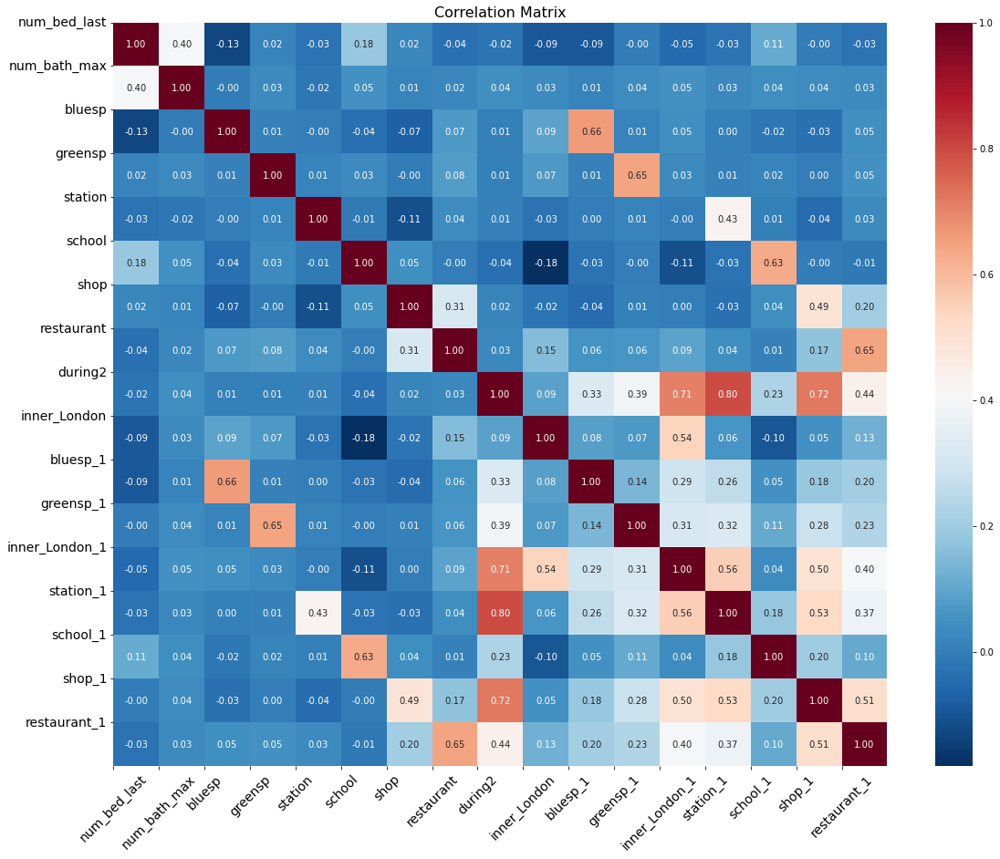

In [150]:
# 假设你已经有了数据框 df
df =X_pre_during2

plt.rcParams["axes.grid"] = False
plt.figure(figsize=(19, 15))

# 计算相关性矩阵
corr_matrix = df.corr()

# 使用Seaborn绘制红蓝配色的相关性矩阵
sns.heatmap(corr_matrix, cmap='RdBu_r', annot=True, fmt=".2f")

plt.xticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14, rotation=45)
plt.yticks(range(len(corr_matrix.columns)), corr_matrix.columns, fontsize=14)
plt.title('Correlation Matrix', fontsize=16)

plt.show()

In [151]:
# using VIF on the bike_rental dataset
df_predictors_selected_VIF_pre_during2 = drop_column_using_vif_(X_pre_during22)
# Note that there is a 'while' loop in the drop_column_using_vif_. In each iteration, one variable is dropped.
print("The columns remaining after VIF selection are:")
print(df_predictors_selected_VIF_pre_during2.columns)

C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: inner_London


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bed_last_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: num_bath_max_0


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: property_type_Detached house


C:\Program Files\Anaconda3\lib\site-packages\statsmodels\regression\linear_model.py:1736: RuntimeWarning: divide by zero encountered in double_scalars
  return 1 - self.ssr/self.centered_tss
C:\Program Files\Anaconda3\lib\site-packages\statsmodels\stats\outliers_influence.py:195: RuntimeWarning: divide by zero encountered in double_scalars
  vif = 1. / (1. - r_squared_i)


Dropping: LAD11CD_E09000001
Dropping: num_bed_last_2
Dropping: LAD11CD_E09000033
Dropping: property_type_Flat
Dropping: during2
The columns remaining after VIF selection are:
Index(['bluesp', 'greensp', 'station', 'school', 'shop', 'restaurant',
       'bluesp_1', 'greensp_1', 'inner_London_1', 'station_1', 'school_1',
       'shop_1', 'restaurant_1', 'num_bed_last_1', 'num_bed_last_3',
       'num_bed_last_4', 'num_bed_last_5', 'num_bed_last_6', 'num_bath_max_1',
       'num_bath_max_2', 'num_bath_max_3', 'num_bath_max_4',
       'property_type_End terrace house', 'property_type_Maisonette',
       'property_type_Semi-detached house', 'property_type_Studio',
       'property_type_Terraced house', 'LAD11CD_E09000002',
       'LAD11CD_E09000003', 'LAD11CD_E09000004', 'LAD11CD_E09000005',
       'LAD11CD_E09000006', 'LAD11CD_E09000007', 'LAD11CD_E09000008',
       'LAD11CD_E09000009', 'LAD11CD_E09000010', 'LAD11CD_E09000011',
       'LAD11CD_E09000012', 'LAD11CD_E09000013', 'LAD11CD_E090

In [92]:
model_pre_during2 = sm.OLS(pre_during2_dummy['price_last'],X_pre_during22).fit()
print(model_pre_during2.summary())

                            OLS Regression Results                            
Dep. Variable:             price_last   R-squared:                       0.603
Model:                            OLS   Adj. R-squared:                  0.603
Method:                 Least Squares   F-statistic:                     4030.
Date:                Sun, 20 Aug 2023   Prob (F-statistic):               0.00
Time:                        18:39:40   Log-Likelihood:            -1.0735e+06
No. Observations:              170080   AIC:                         2.147e+06
Df Residuals:                  170015   BIC:                         2.148e+06
Df Model:                          64                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Unname

In [ ]:
Zoopla_reg_dummy

In [15]:

during_post1 = pd.concat([during,post1])


In [70]:
pre_during = pd.concat([pre,during])
pre_post = pd.concat([pre,post])


In [30]:
during2_post1 = pd.concat([during2,post1])

In [42]:
during2_post1_1= pd.get_dummies(during2_post1,columns=['property_type'])

In [16]:
during_post1_1= pd.get_dummies(during_post1,columns=['property_type'])

In [17]:
during_post1_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 396401 entries, 1 to 689870
Data columns (total 34 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   Unnamed: 0                         396401 non-null  int64  
 1   property_id                        396401 non-null  float64
 2   start_date_new                     396401 non-null  object 
 3   price_last                         396401 non-null  int64  
 4   num_bed_last                       396401 non-null  int64  
 5   num_floors_max                     396401 non-null  int64  
 6   num_bath_max                       396401 non-null  int64  
 7   end_date_new                       396401 non-null  object 
 8   duration                           396401 non-null  object 
 9   duration_1                         396401 non-null  int64  
 10  lnprice                            396401 non-null  float64
 11  post                               3964

In [43]:
interact_col = ['bluesp','greensp','inner_London','property_type_Detached house','property_type_Flat','property_type_Maisonette',
                'property_type_Semi-detached house','property_type_Studio','property_type_Terraced house']
#'station','school','shop','restaurant',
for col in interact_col:
    during2_post1_1[f'{col}_1'] = during2_post1_1['post1'] *during2_post1_1[col]

In [71]:
interact_col = ['bluesp','greensp','station','school','shop','restaurant','inner_London']
#,
for col in interact_col:
    pre_during[f'{col}_1'] = pre_during['post1'] *pre_during[col]
    during_post[f'{col}_1'] =during_post['post1'] *during_post[col]
    pre_post[f'{col}_1'] =pre_post['post1'] *pre_post[col]

In [37]:
during2_post1_1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 269800 entries, 1 to 689870
Data columns (total 47 columns):
 #   Column                               Non-Null Count   Dtype         
---  ------                               --------------   -----         
 0   Unnamed: 0                           269800 non-null  int64         
 1   property_id                          269800 non-null  float64       
 2   start_date_new                       269800 non-null  object        
 3   price_last                           269800 non-null  int64         
 4   num_bed_last                         269800 non-null  int64         
 5   num_floors_max                       269800 non-null  int64         
 6   num_bath_max                         269800 non-null  int64         
 7   end_date_new                         269800 non-null  object        
 8   duration                             269800 non-null  object        
 9   duration_1                           269800 non-null  int64         
 

In [44]:
during2_post1_dummy= pd.get_dummies(during2_post1_1,columns=['LAD11CD','num_bed_last','num_bath_max'])

In [88]:
pre_during_dummy= pd.get_dummies(pre_during,columns=['property_type','LAD11CD','num_bed_last','num_bath_max'])
during_post_dummy= pd.get_dummies(during_post,columns=['property_type','LAD11CD','num_bed_last','num_bath_max'])
pre_post_dummy= pd.get_dummies(pre_post,columns=['property_type','LAD11CD','num_bed_last','num_bath_max'])

In [79]:
pre_post_dummy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 481979 entries, 0 to 689877
Data columns (total 87 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   Unnamed: 0                         481979 non-null  int64         
 1   property_id                        481979 non-null  float64       
 2   start_date_new                     481979 non-null  object        
 3   price_last                         481979 non-null  int64         
 4   num_floors_max                     481979 non-null  int64         
 5   end_date_new                       481979 non-null  object        
 6   duration                           481979 non-null  object        
 7   duration_1                         481979 non-null  int64         
 8   lnprice                            481979 non-null  float64       
 9   post                               481979 non-null  int64         
 10  post2               

In [48]:
X_during2_post1=during2_post1_dummy.drop(columns=['property_id','start_date_new','price_last','num_floors_max','end_date_new','duration','lnprice','post',
                                 'pre','during','during1','during2','post2','LSOA11CD','LSOA11NM','LAD11NM','filter','duration_1','Unnamed: 0','covid_stage','edate'])

In [65]:
X_during_post_dummy=during_post_dummy.drop(columns=['property_id','start_date_new','price_last','num_floors_max','end_date_new','duration','lnprice','post1',
                                 'pre','post','during1','during2','post2','LSOA11CD','LSOA11NM','LAD11NM','filter','duration_1','Unnamed: 0','covid_stage','edate'])

In [73]:
X_during_post_dummy2=during_post_dummy.drop(columns=['property_id','start_date_new','price_last','num_floors_max','end_date_new','duration','lnprice','post1',
                                 'pre','during','during1','during2','post2','LSOA11CD','LSOA11NM','LAD11NM','filter','duration_1','Unnamed: 0','covid_stage','edate'])

In [89]:
X_pre_post_dummy=pre_post_dummy.drop(columns=['property_id','start_date_new','price_last','num_floors_max','end_date_new','duration','lnprice','post1',
                                 'pre','during','during1','during2','post2','LSOA11CD','LSOA11NM','LAD11NM','filter','duration_1','Unnamed: 0','covid_stage','edate'])

In [66]:
X_pre_during_dummy=pre_during_dummy.drop(columns=['property_id','start_date_new','price_last','num_floors_max','end_date_new','duration','lnprice','post1',
                                 'pre','post','during1','during2','post2','LSOA11CD','LSOA11NM','LAD11NM','filter','duration_1','Unnamed: 0','covid_stage','edate'])

In [93]:
X_during_post_dummy2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 496106 entries, 1 to 689877
Data columns (total 66 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   post                               496106 non-null  int64
 1   bluesp                             496106 non-null  int64
 2   greensp                            496106 non-null  int64
 3   station                            496106 non-null  int64
 4   school                             496106 non-null  int64
 5   shop                               496106 non-null  int64
 6   restaurant                         496106 non-null  int64
 7   inner_London                       496106 non-null  int64
 8   bluesp_1                           496106 non-null  int64
 9   greensp_1                          496106 non-null  int64
 10  station_1                          496106 non-null  int64
 11  school_1                           496106 non-null  int64
 12  sh

In [67]:
model_during_post = sm.OLS(during_post_dummy['price_last'],X_during_post_dummy).fit()
model_pre_during = sm.OLS(pre_during_dummy['price_last'],X_pre_during_dummy).fit()

In [91]:
model_during_post2 = sm.OLS(during_post_dummy['price_last'],X_during_post_dummy2).fit()
model_pre_post = sm.OLS(pre_post_dummy['price_last'],X_pre_post_dummy).fit()

In [94]:
model_during_post2 = sm.OLS(during_post_dummy['price_last'],X_during_post_dummy2).fit()
print(model_pre_post.summary())

                            OLS Regression Results                            
Dep. Variable:             price_last   R-squared:                       0.615
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                 1.261e+04
Date:                Thu, 17 Aug 2023   Prob (F-statistic):               0.00
Time:                        20:54:35   Log-Likelihood:            -3.0740e+06
No. Observations:              481979   AIC:                         6.148e+06
Df Residuals:                  481917   BIC:                         6.149e+06
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
post  

In [90]:
model_pre_post = sm.OLS(pre_post_dummy['price_last'],X_pre_post_dummy).fit()
print(model_pre_post.summary())

                            OLS Regression Results                            
Dep. Variable:             price_last   R-squared:                       0.615
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                 1.261e+04
Date:                Thu, 17 Aug 2023   Prob (F-statistic):               0.00
Time:                        20:51:46   Log-Likelihood:            -3.0740e+06
No. Observations:              481979   AIC:                         6.148e+06
Df Residuals:                  481917   BIC:                         6.149e+06
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
post  

In [92]:
models = [model_during_post, model_pre_post]
names = ['during_post', 'pre_post']

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)


                                  during_post       pre_post      
------------------------------------------------------------------
LAD11CD_E09000001                 120.446***  1905848636461.350   
                                  (2.736)     (18711618006529.781)
LAD11CD_E09000002                 10.432***   -1263329546209.143  
                                  (2.382)     (12403366896315.318)
LAD11CD_E09000003                 77.318***   -1263329546142.863  
                                  (1.031)     (12403366896315.258)
LAD11CD_E09000004                 -2.740      -1263329546223.418  
                                  (2.362)     (12403366896315.354)
LAD11CD_E09000005                 81.549***   -1263329546133.932  
                                  (1.119)     (12403366896315.273)
LAD11CD_E09000006                 28.747***   -1263329546192.557  
                                  (1.720)     (12403366896315.299)
LAD11CD_E09000007                 65.628***   1905848636388.5

In [84]:
print(model_pre_post.summary())

                            OLS Regression Results                            
Dep. Variable:             price_last   R-squared:                       0.615
Model:                            OLS   Adj. R-squared:                  0.615
Method:                 Least Squares   F-statistic:                 1.261e+04
Date:                Thu, 17 Aug 2023   Prob (F-statistic):               0.00
Time:                        20:50:25   Log-Likelihood:            -3.0740e+06
No. Observations:              481979   AIC:                         6.148e+06
Df Residuals:                  481917   BIC:                         6.149e+06
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
post  

In [69]:
models = [model_during_post, model_pre_during]
names = ['during_post', 'pre_during']

table = summary_col(
    models,
    stars=True,
    float_format='%0.3f',
    model_names=names,
    info_dict={'N': lambda x: '{0:d}'.format(int(x.nobs))})

print(table)


                                  during_post  pre_during
---------------------------------------------------------
during                            -82.018***  -13.902*** 
                                  (0.536)     (0.438)    
bluesp                            1.926***    -9.139***  
                                  (0.671)     (0.586)    
greensp                           16.093***   7.934***   
                                  (0.601)     (0.516)    
station                           0.166       -12.924*** 
                                  (0.571)     (0.523)    
school                            -5.165***   -14.700*** 
                                  (0.900)     (0.770)    
shop                              -2.735***   -13.440*** 
                                  (0.565)     (0.499)    
restaurant                        13.377***   12.318***  
                                  (0.602)     (0.514)    
inner_London                      179.427***  163.357*** 
             

In [50]:
model_during2_post1 = sm.OLS(during2_post1_dummy['price_last'],X_during2_post1).fit()

print(model_during2_post1.summary())

                            OLS Regression Results                            
Dep. Variable:             price_last   R-squared:                       0.582
Model:                            OLS   Adj. R-squared:                  0.582
Method:                 Least Squares   F-statistic:                     6057.
Date:                Thu, 17 Aug 2023   Prob (F-statistic):               0.00
Time:                        20:19:40   Log-Likelihood:            -1.7041e+06
No. Observations:              269800   AIC:                         3.408e+06
Df Residuals:                  269737   BIC:                         3.409e+06
Df Model:                          62                                         
Covariance Type:            nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------------
po

In [2]:
Zoopla_text3=pd.read_csv('Zoopla_reg_0816.csv')

In [5]:
Zoopla_reg=Zoopla_text3.copy()

In [6]:
Zoopla_reg['edate']=pd.to_datetime(Zoopla_reg['end_date_new'],format='%Y-%m-%d',errors='coerce')

In [5]:
inner = Zoopla_reg[Zoopla_reg['inner_London']==1]
outer = Zoopla_reg[Zoopla_reg['inner_London']==0]

In [6]:
inner1=inner.copy()

inner1.set_index('edate',inplace=True)

monthly_price_inner=inner1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [7]:
outer1=outer.copy()

outer1.set_index('edate',inplace=True)

monthly_price_outer=outer1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

In [8]:
Zoopla_reg1=Zoopla_reg.copy()

Zoopla_reg1.set_index('edate',inplace=True)

monthly_price=Zoopla_reg1.groupby([pd.Grouper(freq='M')]).price_last.agg('mean').reset_index()

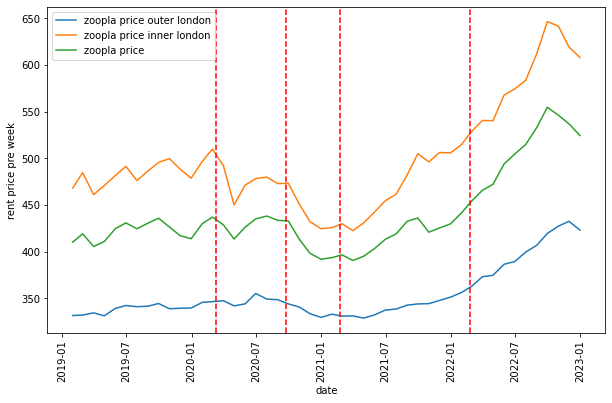

In [9]:
fig,ax=plt.subplots(figsize=(10,6))

ax.set_xlabel("date")
ax.set_ylabel("rent price pre week")
#ax.plot(monthly_price_all['edate'], monthly_price_all.price_last,label='zoopla price raw')
ax.plot(monthly_price_outer['edate'], monthly_price_outer.price_last,label='Zoopla Price Outer London')
ax.plot(monthly_price_inner['edate'], monthly_price_inner.price_last,label='Zoopla Price Inner London')
ax.plot(monthly_price['edate'], monthly_price.price_last,label='Zoopla Price London')
# Rotate the x-axis tick labels for better visibility
plt.xticks(rotation='vertical')

# Define the vertical lines dates for both red and blue lines
vertical_line_dates1 = [pd.to_datetime('2020-03-11'), pd.to_datetime('2020-09-22'),pd.to_datetime('2021-02-22'), pd.to_datetime('2022-02-24')]
#vertical_line_dates2 = [pd.to_datetime('2020-03-23'), pd.to_datetime('2020-04-08')]
#pd.to_datetime('2020-11-05'), pd.to_datetime('2021-01-04')]

# Plot the red vertical lines
for date in vertical_line_dates1:
    plt.axvline(x=date, color='red', linestyle='--')

# Plot the blue vertical lines
#for date in vertical_line_dates2:plt.axvline(x=date, color='blue', linestyle='--')

# Display the plot
plt.legend()
plt.show()

In [7]:
t1 = pd.to_datetime('2020-03-11')
t2 = pd.to_datetime('2020-09-22')
t3 = pd.to_datetime('2021-02-22')
t4 = pd.to_datetime('2022-02-24')
# Create boolean masks for 'post', 'pre', and 'during' periods
pre_mask = Zoopla_reg['edate'] < t1

during_mask = (Zoopla_reg['edate'] >= t1) & (Zoopla_reg['edate'] <= t3)
during1_mask = (Zoopla_reg['edate'] > t1) & (Zoopla_reg['edate'] <= t2)
during2_mask = (Zoopla_reg['edate'] > t2) & (Zoopla_reg['edate'] <= t3)

post_mask = Zoopla_reg['edate'] > t3
post2_mask = Zoopla_reg['edate'] > t4
post1_mask = (Zoopla_reg['edate'] > t3) & (Zoopla_reg['edate'] <= t4)

# Assign 0 or 1 based on the boolean masks to new columns 'post', 'pre', and 'during'
Zoopla_reg['during1'] = during1_mask.astype(int)
Zoopla_reg['during2'] = during2_mask.astype(int)
Zoopla_reg['post'] = post_mask.astype(int)
Zoopla_reg['post2'] = post2_mask.astype(int)
Zoopla_reg['post1'] = post1_mask.astype(int)
Zoopla_reg['pre'] = pre_mask.astype(int)
Zoopla_reg['during'] = during_mask.astype(int)

In [115]:
Zoopla_reg_dummy= pd.get_dummies(Zoopla_reg,columns=['property_type','num_bed_last','num_bath_max'])

In [113]:
pre = Zoopla_reg[Zoopla_reg['pre']==1]
during = Zoopla_reg[Zoopla_reg['during']==1]
during1 = Zoopla_reg[Zoopla_reg['during1']==1]
during2 = Zoopla_reg[Zoopla_reg['during2']==1]
post = Zoopla_reg[Zoopla_reg['post']==1]
post1 =  Zoopla_reg[Zoopla_reg['post1']==1]
post2 = Zoopla_reg[Zoopla_reg['post2']==1]


In [116]:
during = Zoopla_reg_dummy[Zoopla_reg_dummy['during']==1]
post1 =  Zoopla_reg_dummy[Zoopla_reg_dummy['post1']==1]

In [13]:
pre.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 196726 entries, 0 to 696828
Data columns (total 33 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   Unnamed: 0         196726 non-null  int64  
 1   property_id        196726 non-null  float64
 2   start_date_new     196726 non-null  object 
 3   price_last         196726 non-null  int64  
 4   property_type      196726 non-null  object 
 5   num_bed_last       196726 non-null  int64  
 6   num_bath_max       196726 non-null  int64  
 7   description        196726 non-null  object 
 8   end_date_new       196726 non-null  object 
 9   duration           196726 non-null  object 
 10  duration_1         196726 non-null  int64  
 11  lnprice            196726 non-null  float64
 12  post               196726 non-null  int64  
 13  post2              196726 non-null  int64  
 14  post1              196726 non-null  int64  
 15  pre                196726 non-null  int64  
 16  du

In [ ]:
pre_lsoa = 

In [133]:
# 使用 groupby 对 Zoopla_joined 进行分组，按 lsoa 多边形进行聚合
during_lsoa=during.groupby('LSOA11CD').agg({
    'price_last': 'mean',   
    'lnprice': 'mean',# 计算平均价格
    'property_id' : 'count',
     
    'post': 'mean',# 计算每个 lsoa 多边形上有多少个 propert
    'greensp': 'sum',
    'station': 'sum',
    'bluesp': 'sum',
    'shop': 'sum',
    'restaurant': 'sum',
    'school': 'sum',
    'inner_London':'mean',                         
    'property_type_Detached house':'sum',         
    'property_type_Flat': 'sum',                 
    'property_type_Maisonette': 'sum',            
    'property_type_Semi-detached house': 'sum',    
    'property_type_Studio': 'sum',                 
    'property_type_Terraced house': 'sum',    
    'property_type_End terrace house':'sum',
    'num_bed_last_0': 'sum',                       
    'num_bed_last_1': 'sum',                      
    'num_bed_last_2': 'sum',                       
    'num_bed_last_3': 'sum',                       
    'num_bed_last_4': 'sum',                       
    'num_bed_last_5': 'sum',                       
    'num_bed_last_6': 'sum',                       
    'num_bath_max_0': 'sum',                       
    'num_bath_max_1': 'sum',                       
    'num_bath_max_2': 'sum',                       
    'num_bath_max_3': 'sum', 
# 计算 garden 列中值为 1 的出现次数
}).reset_index()


In [134]:
# 使用 groupby 对 Zoopla_joined 进行分组，按 lsoa 多边形进行聚合
post1_lsoa=post1.groupby('LSOA11CD').agg({
    'price_last': 'mean',   
    'lnprice': 'mean',# 计算平均价格
    'property_id' : 'count',
    'post': 'mean',  
    
    'greensp': 'sum',
    'station': 'sum',
    'bluesp': 'sum',
    'shop': 'sum',
    'restaurant': 'sum',
    'school': 'sum',
    'inner_London':'mean',
    'property_type_End terrace house':'sum',
                             
    'property_type_Detached house':'sum',         
    'property_type_Flat': 'sum',                 
    'property_type_Maisonette': 'sum',            
    'property_type_Semi-detached house': 'sum',    
    'property_type_Studio': 'sum',                 
    'property_type_Terraced house': 'sum',         
    'num_bed_last_0': 'sum',                       
    'num_bed_last_1': 'sum',                      
    'num_bed_last_2': 'sum',                       
    'num_bed_last_3': 'sum',                       
    'num_bed_last_4': 'sum',                       
    'num_bed_last_5': 'sum',                       
    'num_bed_last_6': 'sum',                       
    'num_bath_max_0': 'sum',                       
    'num_bath_max_1': 'sum',                       
    'num_bath_max_2': 'sum',                       
    'num_bath_max_3': 'sum', 
# 计算 garden 列中值为 1 的出现次数
}).reset_index()


In [135]:
during_post_lsoa = pd.concat([during_lsoa,post1_lsoa])

In [136]:
columns_to_calculate = ['greensp',
 'station',
 'bluesp',
 'shop',
 'restaurant',
 'school',
 'property_type_Detached house',
 'property_type_Flat',
 'property_type_Maisonette',
 'property_type_Semi-detached house',
 'property_type_Studio',
 'property_type_Terraced house',
 'property_type_End terrace house',
 'num_bed_last_0',
 'num_bed_last_1',
 'num_bed_last_2',
 'num_bed_last_3',
 'num_bed_last_4',
 'num_bed_last_5',
 'num_bed_last_6',
 'num_bath_max_0',
 'num_bath_max_1',
 'num_bath_max_2',
 'num_bath_max_3']

for column in columns_to_calculate:
    during_post_lsoa[column + '_idf'] = during_post_lsoa[column] / during_post_lsoa['property_id']

In [138]:
interact_col = ['bluesp_idf','greensp_idf','inner_London','station_idf','shop_idf','restaurant_idf']

for col in interact_col:
    during_post_lsoa[f'{col}_1'] = during_post_lsoa['post'] *during_post_lsoa[col]

In [140]:
X=during_post_lsoa.drop(columns=['LSOA11CD',
 'price_last',
 'lnprice',
 'property_id',
 'greensp',
 'station',
 'bluesp',
 'shop',
 'restaurant',
 'school',                              
 'property_type_Detached house',
 'property_type_Flat',
 'property_type_Maisonette',
 'property_type_Semi-detached house',
 'property_type_Studio',
 'property_type_Terraced house',
 'property_type_End terrace house',
 'num_bed_last_0',
 'num_bed_last_1',
 'num_bed_last_2',
 'num_bed_last_3',
 'num_bed_last_4',
 'num_bed_last_5',
 'num_bed_last_6',
 'num_bath_max_0',
 'num_bath_max_1',
 'num_bath_max_2',
 'num_bath_max_3'])

In [142]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9539 entries, 0 to 4795
Data columns (total 32 columns):
 #   Column                                 Non-Null Count  Dtype  
---  ------                                 --------------  -----  
 0   post                                   9539 non-null   float64
 1   inner_London                           9539 non-null   float64
 2   greensp_idf                            9539 non-null   float64
 3   station_idf                            9539 non-null   float64
 4   bluesp_idf                             9539 non-null   float64
 5   shop_idf                               9539 non-null   float64
 6   restaurant_idf                         9539 non-null   float64
 7   school_idf                             9539 non-null   float64
 8   property_type_Detached house_idf       9539 non-null   float64
 9   property_type_Flat_idf                 9539 non-null   float64
 10  property_type_Maisonette_idf           9539 non-null   float64
 11  prop

In [144]:
model3 = sm.OLS(during_post_lsoa['lnprice'],X).fit()

print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:                lnprice   R-squared:                       0.612
Model:                            OLS   Adj. R-squared:                  0.611
Method:                 Least Squares   F-statistic:                     500.2
Date:                Sun, 20 Aug 2023   Prob (F-statistic):               0.00
Time:                        22:19:47   Log-Likelihood:                 4731.3
No. Observations:                9539   AIC:                            -9401.
Df Residuals:                    9508   BIC:                            -9179.
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
                                            coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------